<a href="https://colab.research.google.com/github/egorssed/Lensed_Source_modelling_research/blob/main/Models_performance.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from google.colab import drive
drive.mount('/content/drive')
Folder='/content/drive/My Drive/Lensed Source modelling research/'

import tensorflow as tf
device_name = tf.test.gpu_device_name()

import sys
sys.path.append(Folder+'/Modules')
import Image_Stats
import Visual_analysis

image_size=64
batch_size = 32
latent_dim = 64
start_lr = 1e-6

x = np.linspace(0, 64, 64)
y = np.linspace(0, 64, 64)
X, Y = np.meshgrid(x, y)
xdata = np.vstack((X.ravel(), Y.ravel()))

Mounted at /content/drive


In [2]:
from sklearn.model_selection import train_test_split

#We normalize the data to [0,1]
#Initial minI and maxI are stored in the Dataset_labels
#All the negative values set to 0 during preprocessing
def normalize_image(images):
    #Normalize image to [0,1]
    for i in range(len(images)):
        images[i]=images[i]/images[i].max()
    return images

#Read the images and the features from the google drive
galaxy_images=np.load(Folder+'Data/Images_Filtered_Rotated.npy')
df=pd.read_csv(Folder+'Data/Labels_Filtered.csv',index_col=0)

#Bring images to a proper tensorial form
Size_of_dataset=len(galaxy_images[:-(len(galaxy_images)%batch_size)])
Number_of_batches=Size_of_dataset//batch_size
df=df.iloc[:Size_of_dataset]
galaxy_images=normalize_image(galaxy_images[:Size_of_dataset])

#Bring images to a proper tensorial form
gal_dataset_images=np.reshape(galaxy_images, (len(galaxy_images), galaxy_images.shape[1], galaxy_images.shape[2], 1))

#Separate the features we are eager to predict in the latent space
#Features=['Sersic_HLR', 'Sersic_n', 'Sersic_q','Sersic_phi']

#Extract test dataset
x_train, x_test ,y_train,y_test= train_test_split(gal_dataset_images.astype('float32'),df, test_size=round(0.05*Number_of_batches)*batch_size,random_state=42)
#Extract train and validation datasets
x_train, x_val , y_train, y_val= train_test_split(x_train,y_train, test_size=round(0.05*Number_of_batches)*batch_size,random_state=42)
#All the sets have number of galaxies which is a multiple of the batch size (32)
#The random_state is fixed so the split is reproducible yet random

# Chameleon_Sersic

In [ ]:
!pip install lmfit

In [ ]:
from lmfit import Parameters, minimize
import tensorflow as tf
def fit_image_LMA(image,xdata,func,initial_guess,lower_bounds,upper_bounds):

    def residual(pars,xdata, data=None):
        fit=np.zeros(len(pars.items()))
        for i,item in enumerate(pars.items()):
            name,param=item
            fit[i]=param.value
        model=func(xdata,*fit)
        #Chi_sq
        return (model-data)/np.sqrt(np.abs(data)+image.max()*1e-5)

    fit_params = Parameters()

    for i in range(len(initial_guess)):
        fit_params.add(name='par{}'.format(i),value=initial_guess[i], max=upper_bounds[i], min=lower_bounds[i])

    out = minimize(residual, fit_params,args=(xdata,),
                   kws={'data': image.ravel()})

    fit=np.zeros(len(out.params.items()))
    errs=np.zeros(len(out.params.items()))
    for i,item in enumerate(out.params.items()):
        name,param=item
        fit[i]=param.value
        errs[i]=param.stderr

    return fit,errs

In [ ]:
def get_Chameleon_Sersic_fit(image):
  func=Image_Stats.Chameleon_Sersic
  n_initial=1
  k=2*n_initial-0.324
  initial_guess=np.array([image.max()*20,2,0.1,0.88,0,
                             image.max()*np.exp(-k),10,n_initial,0.88,0,
                             image.shape[1]/2,image.shape[0]/2])
  lower_bounds=np.array([image.max()*1e-5,0,0,0.01,-np.pi/2,
                           0,0,0.5,0.01,-np.pi/2,
                           0,0])
  upper_bounds=np.array([np.inf,np.inf,1,1,np.pi/2,
                           image.max(),np.min(image.shape)/2,6,1,np.pi/2,
                           image.shape[1],image.shape[0]])
  
  return fit_image_LMA(image,xdata,func,initial_guess,lower_bounds,upper_bounds)

In [ ]:
Chameleon_Sersic_columns=['Chameleon_I','Chameleon_Wt','Chameleon_Wratio','Chameleon_q','Chameleon_phi',
                                     'Sersic_I','Sersic_HLR','Sersic_n','Sersic_q','Sersic_phi','Sersic_x0','Sersic_y0','chi_sq','SSIM','RAE_Max']
Chameleon_Sersic_fits=pd.DataFrame(columns=Chameleon_Sersic_columns)

for i in tqdm(range(5000)):
  fit,_=get_Chameleon_Sersic_fit(galaxy_images[i])
  model_image=Image_Stats.Chameleon_Sersic(xdata,*fit).reshape(64,64)
  chi_squared=Image_Stats.chi_sq(galaxy_images[i],model_image)/64/64
  SSIM=tf.image.ssim(galaxy_images[i].reshape(1,64,64,1),model_image.reshape(1,64,64,1),max_val=1,filter_size=8).numpy()[0]
  RAE_Max=np.abs(1-model_image.max())
  stats=[chi_squared,SSIM,RAE_Max]
  Chameleon_Sersic_fits=Chameleon_Sersic_fits.append(pd.Series(np.append(fit,stats),index=Chameleon_Sersic_columns),ignore_index=True)

In [ ]:
Chameleon_Sersic_fits.to_csv(Folder+'Data/Chameleon_Sersic_fits_5000.csv')

# Neural Nets

## VAE


### libraries


In [13]:
import tensorflow as tf
from keras.layers import Input, Dense, BatchNormalization,Flatten,Reshape,Lambda,Conv2D,Conv2DTranspose,LeakyReLU
from keras.models import Model
from keras.optimizers import Adam
from keras import initializers
from tensorflow.python.ops import math_ops
from tensorflow.python.framework import ops,smart_cond
import keras.backend as K

### encoder

In [14]:
def encoder_function(input_img):
    #He initialization for Relu activated layers
    Heinitializer = initializers.HeNormal()

    x = Conv2D(filters=64, kernel_size=4, strides=2,padding='same',use_bias=False,kernel_initializer=Heinitializer)(input_img)
    x = LeakyReLU(0.2)(x)
    
    x = Conv2D(filters=128, kernel_size=4, strides=2,padding='same',use_bias=False,kernel_initializer=Heinitializer)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    
    x = Conv2D(filters=256, kernel_size=4, strides=2,padding='same',use_bias=False,kernel_initializer=Heinitializer)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    
    x = Conv2D(filters=512, kernel_size=4, strides=2,padding='same',use_bias=False,kernel_initializer=Heinitializer)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    
    x = Conv2D(filters=4096, kernel_size=4, strides=1,padding='valid',use_bias=False,kernel_initializer=Heinitializer)(x)
    x = LeakyReLU(0.2)(x)
    
    x = Flatten()(x)
    
    
    #Predict mean of standard distribution and logarithm of variance
    Xavierinitializer=initializers.GlorotNormal()

    z_mean = Dense(latent_dim,kernel_initializer=initializers.Constant(value=0),bias_initializer=initializers.Constant(value=0))(x)
    z_log_var = Dense(latent_dim, kernel_initializer=initializers.Constant(value=0),bias_initializer=initializers.Constant(value=0))(x)

    return z_mean,z_log_var

### decoder

In [15]:
def get_decoder(activation):
  def decoder_function(z):
    #He initialization for Relu activated layers
    Heinitializer = initializers.HeNormal()

    x = Reshape(target_shape=(1, 1, 64))(z)
    
    x = Conv2DTranspose(filters=512, kernel_size=4, strides=1,padding='valid',use_bias=False,kernel_initializer=Heinitializer)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    
    x = Conv2DTranspose(filters=256, kernel_size=4, strides=2,padding='same',use_bias=False,kernel_initializer=Heinitializer)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    
    x = Conv2DTranspose(filters=128, kernel_size=4, strides=2,padding='same',use_bias=False,kernel_initializer=Heinitializer)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    
    x = Conv2DTranspose(filters=64, kernel_size=4, strides=2,padding='same',use_bias=False,kernel_initializer=Heinitializer)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)

    #Xavier intialization for differentiable functions activated layers
    Xavierinitializer=initializers.GlorotNormal()
    if activation=='':
      decoded = Conv2DTranspose(filters=1, kernel_size=4, strides=2,padding='same',use_bias=False
                                ,kernel_initializer=Xavierinitializer)(x)
    else:
      decoded = Conv2DTranspose(filters=1, kernel_size=4, strides=2,padding='same',use_bias=False,
                              activation=activation,kernel_initializer=Xavierinitializer)(x)
  
    return decoded
  return decoder_function

### loss

In [16]:
def get_reconstruction_loss(loss_type='chi_sq'):

  #Chose original loss function
  if (loss_type=='chi_sq') or (loss_type=='mse'):
      loss_function=tf.math.squared_difference
  if loss_type=='binary_crossentropy':
      loss_function=K.binary_crossentropy

  def reconstruction_loss_function(y_true,y_pred):
    y_pred = tf.convert_to_tensor(y_pred)
    y_true = tf.cast(y_true, y_pred.dtype)

    reconstruction_loss=loss_function(y_true,y_pred)

    #cast mse to chi_square by adding weights
    if (loss_type=='chi_sq'):
      #Poisson weights (sigma=sqrt(image))
      weights=tf.math.pow(tf.sqrt(tf.abs(y_true)+1e-5),-1)
      weights= math_ops.cast(weights, y_pred.dtype)
      reconstruction_loss=reconstruction_loss*weights
    
    return K.sum(reconstruction_loss,axis=-1)
  
  return reconstruction_loss_function

def get_regularization_loss(beta_vae=1e-3,gamma=None):
  #Capacity is a global variable that is changed during training
  def regularization_loss_function(mean,logvar):
    KL_loss=0.5 * K.sum(K.exp(logvar)+K.square(mean)-1-logvar, axis=-1)
    if (gamma is not None) and (Capacity is not None):  
      return gamma*tf.abs(KL_loss-Capacity)
    else:
      return beta_vae*KL_loss
  
  return regularization_loss_function

In [17]:
def get_model_loss(beta_vae=1e-3,loss_type='chi_sq',gamma=None):

  reconstruction_loss_function=get_reconstruction_loss(loss_type)
  regularization_loss_function=get_regularization_loss(beta_vae,gamma)

  def model_loss_function(x,decoded):

    #KL divergence regularization quality
    mean = models['z_meaner'](x)
    logvar=models['z_log_varer'](x)
    regularization_loss=regularization_loss_function(mean,logvar)

    #reconstruction quality
    flattened_x=K.reshape(x,shape=(len(x),image_size*image_size))
    flattened_decoded=K.reshape(decoded,shape=(len(decoded),image_size*image_size))
    reconstruction_loss=reconstruction_loss_function(flattened_x,flattened_decoded)

    Beta_VAE_Loss=(reconstruction_loss+regularization_loss)/image_size/image_size
    return Beta_VAE_Loss

  return model_loss_function,reconstruction_loss_function,regularization_loss_function

### vae class

In [18]:
def create_vae(beta_vae=1e-3,activation='softplus',loss_type='chi_sq',gamma=None):

    #Reparametrization trick
    def reparameterize(args):
      mean,logvar=args
      eps = tf.random.normal(shape=mean.shape)
      return eps * tf.exp(logvar/2) + mean
    decoder_function=get_decoder(activation)
    model_loss_function,reconstruction_loss_function,regularization_loss_function=get_model_loss(beta_vae,loss_type,gamma)


    #VAE
    models = {}

    #Encoder
    input_img = Input(batch_shape=(batch_size, image_size, image_size, 1))

    z_mean, z_log_var=encoder_function(input_img)

    l=Lambda(reparameterize, output_shape=(latent_dim,))([z_mean, z_log_var])

    models["encoder"]  = Model(input_img, l, name='Encoder') 
    models["z_meaner"] = Model(input_img, z_mean, name='Enc_z_mean')
    models["z_log_varer"] = Model(input_img, z_log_var, name='Enc_z_log_var')

    #Decoder
    z = Input(shape=(latent_dim, ))
    decoded=decoder_function(z)

    models["decoder"] = Model(z, decoded, name='Decoder')
    models["vae"]     = Model(input_img, models["decoder"](models["encoder"](input_img)), name="VAE")

    return models,model_loss_function,reconstruction_loss_function,regularization_loss_function

In [19]:
def get_Neural_Network(beta_vae=1e-3,activation='softplus',loss_type='chi_sq',gamma=None):
  with tf.device('/device:GPU:0'):
    models,model_loss_function,reconstruction_loss_function,regularization_loss_function =create_vae(beta_vae,activation,loss_type,gamma)

    models["vae"].compile(optimizer=Adam(learning_rate=start_lr, beta_1=0.5, beta_2=0.999,clipvalue=1), loss=model_loss_function)

    return models,model_loss_function,reconstruction_loss_function,regularization_loss_function

## Functions

In [25]:
from matplotlib import cm
import seaborn as sns

indices_to_compare=np.zeros(32,dtype=int)
indices_to_compare[:10]=[34,46,29,92,58,120,149,155,160,148]
imgs = x_test[indices_to_compare]
n_compare = 9

def plot_galaxies(*args,dimensions='2d',colorbar=False):
    #(num_of_rows,num_of_cols,im_shape[0],im_shape[1])
    args = [x.squeeze() for x in args]
    #num of cols
    n = min([x.shape[0] for x in args])
    I_max=np.max(args)
    print('Maximal brightness',I_max)

    if dimensions=='2d':
      fig=plt.figure(figsize=(2*n, 2*len(args)))
    else:
      fig=plt.figure(figsize=(5*n, 5*len(args)))

    for row in range(len(args)):
        for col in range(n):
            if dimensions=='2d':
                ax = fig.add_subplot(len(args),n,row*n+col+1)
                im=ax.imshow(args[row][col].squeeze(),cmap='Greys_r',vmax=I_max)
            else:
                ax = fig.add_subplot(len(args),n,row*n+col+1, projection='3d')
                ax.plot_surface(X, Y, args[row][col].squeeze(), cmap=cm.coolwarm,
                            linewidth=0, antialiased=False)
                ax.set_zlim(0,I_max)
            ax.set_xticks([])
            ax.set_yticks([])
    plt.subplots_adjust(wspace=0,hspace=0)
    plt.show()

def present_reconstruction(models,imgs,dimensions='2d',resid=False):
    #Images selection
    images_for_reconst=imgs
    decoded_to_reconstruct=models['vae'].predict(images_for_reconst, batch_size=len(imgs))
    plot_galaxies(images_for_reconst[:10],decoded_to_reconstruct[:10],dimensions=dimensions)
    if resid:
      residuals=decoded_to_reconstruct-images_for_reconst
      plot_galaxies(residuals[:10],dimensions=dimensions,colorbar=True)

def latent_relation_of_variances(ratio,sorted=False):
    if sorted:
      g=sns.barplot(x=np.linspace(0,64,64),y=np.sort(ratio)[::-1])
    else:
      g=sns.barplot(x=np.linspace(0,64,64),y=ratio)
    #g.xaxis.set_visible(False)
    plt.hlines(1,0,63,label=r'$\mu_{std}=\sigma_{mean}$')
    plt.legend()
    plt.xticks([])
    plt.xlabel('Latent variable')
    plt.ylabel('Ratio')
    plt.title(r'$\mu_{std}/\sigma_{mean}$')
    plt.show()

def DKL_per_variable(z_means,z_log_vars):
    DKL=-0.5 * K.mean(1 + z_log_vars - K.square(z_means) - K.exp(z_log_vars), axis=0)
    sns.barplot(x=np.linspace(0,64,64),y=np.sort(DKL)[::-1])
    plt.xticks([])
    plt.xlabel('Latent variable')
    plt.ylabel('nats')
    plt.title(r'KL_div')
    plt.show()
    return K.eval(DKL)

def galaxy_properties_from_latent_variables(models,z_means,number_of_z_to_consider=64,dimensions='2d',sort_array=None):
  latent_average=z_means.mean(axis=0)
  if sort_array is None:
    variables_to_consider=np.linspace(0,number_of_z_to_consider-1,number_of_z_to_consider,dtype=int)
  else:
    variables_to_consider=np.argsort(sort_array)[::-1][:number_of_z_to_consider]
  variances_to_consider=z_means.std(axis=0)[variables_to_consider]
  z_to_consider=np.zeros((number_of_z_to_consider,7,64))
  #i - number of variable to change
  for i in range(number_of_z_to_consider):
    #j - number of sigmas to add to it
    for j in range(7):
      #Assign everything to be like average galaxy
      z_to_consider[i,j,:]=latent_average
      #Vary one of the variables to get mu+-(0,1,2,3)*sigma
      z_to_consider[i,j,variables_to_consider[i]]+=(j-3)*variances_to_consider[i]
  images_to_consider=models['decoder'].predict(z_to_consider.reshape((number_of_z_to_consider*7,64)))
  #plot_digits(images_to_consider[:7],images_to_consider[7:14])
  for i in range(number_of_z_to_consider):
    plot_galaxies(images_to_consider[i*7:(i+1)*7],dimensions=dimensions)

def sample_random_images(models,z_means):
  sample_z=np.random.normal(z_means.mean(axis=0),z_means.std(axis=0),size=(32,64))
  sample_image=models['decoder'].predict(sample_z)
  plot_galaxies(sample_image[:10],sample_image[10:20],sample_image[20:30])

def latent_distribution(latent_variable):
  fig, axs = plt.subplots(nrows=8, ncols=8, figsize=(20, 20))
  axs_flat = axs.flatten()  
  for i in range(latent_variable.shape[1]):
    axs_flat[i].hist(latent_variable[:,i], bins=50)
    axs_flat[i].set_title('Z {}'.format(i))
    axs_flat[i].get_yaxis().set_visible(False)
  fig.tight_layout()
  plt.show()


def chi_sq(image_true,image_pred):

    y_true=K.reshape(image_true,shape=(len(image_true),image_size*image_size))
    y_pred=K.reshape(image_pred,shape=(len(image_pred),image_size*image_size))
    y_pred = tf.convert_to_tensor(y_pred)
    y_true = tf.cast(y_true, y_pred.dtype)

    reconstruction_loss=tf.math.squared_difference(y_true,y_pred)

    weights=tf.math.pow(tf.sqrt(tf.abs(y_true)+1e-5),-1)
    weights= math_ops.cast(weights, y_pred.dtype)
    reconstruction_loss=reconstruction_loss*weights
    
    return K.eval(K.sum(reconstruction_loss,axis=-1))

import secrets
def disentanglement_score(models,z_means,number_of_z_to_consider=2):
  latent_average=z_means.mean(axis=0)
  latent_stds=z_means.std(axis=0)
  variables_to_consider=np.argsort(ratio)[::-1][:number_of_z_to_consider]
  n=2000
  disent_z=np.zeros((n,64))
  disent_index=np.zeros(n)
  for i in tqdm(range(n)):
    #Pick random index
    index=secrets.choice(variables_to_consider).astype(int)
    #Pick random value for it
    value=np.random.normal(latent_average[index],latent_stds[index])

    z1=np.random.normal(latent_average,latent_stds)
    z2=np.random.normal(latent_average,latent_stds)
  
    #Assign same value
    z1[index]=value
    z2[index]=value

    z1_sampled=models['z_meaner'](models['decoder'].predict(z1.reshape((1,64))))
    z2_sampled=models['z_meaner'](models['decoder'].predict(z2.reshape((1,64))))
    disent_z[i]=np.abs(z1_sampled-z2_sampled)/latent_stds
    disent_index[i]=index

  disent_z_train, disent_z_test ,disent_index_train,disent_index_test=train_test_split(disent_z,disent_index, test_size=0.2,random_state=42)
  disent_z_train, disent_z_val ,disent_index_train,disent_index_val=train_test_split(disent_z_train,disent_index_train, test_size=0.2,random_state=42)
  #disent_index_train=tf.keras.utils.to_categorical(disent_index_train, number_of_z_to_consider)
  #disent_index_val=tf.keras.utils.to_categorical(disent_index_val, number_of_z_to_consider)
  #disent_index_test=tf.keras.utils.to_categorical(disent_index_test, number_of_z_to_consider)

  classifier = tf.keras.Sequential(name="classifier")
  classifier.add(tf.keras.Input(shape=(64,)))
  classifier.add(tf.keras.layers.Dense(number_of_z_to_consider, activation="softmax"))
  with tf.device('/device:GPU:0'):
    classifier.compile(optimizer=tf.keras.optimizers.Adagrad(learning_rate=1e-1), loss='sparse_categorical_crossentropy',metrics='accuracy')

  Stop_callback=tf.keras.callbacks.EarlyStopping(patience = 20)
  classifier.fit(disent_z_train,disent_index_train,batch_size=16,epochs=10000,callbacks=[Stop_callback],validation_data=(disent_z_val,disent_index_val),verbose=0)

  _,disentanglement_score=classifier.evaluate(disent_z_test,disent_index_test,batch_size=16)
  
  resampling_errors=pd.DataFrame(disent_z)
  resampling_errors['index']=disent_index

  return disentanglement_score,resampling_errors

def DKL_learning_curve(filename,start_epoch=0,stop_epoch=1000):
  text_file = open(filename, "r")
  lines = text_file.read().replace('\n','').replace('[','').split(']')
  nums=np.array([np.array([float(x) for x in line.split()]) for line in lines[:-1]])
  text_file.close()

  start_index=start_epoch//10
  stop_index=np.minimum(len(nums),stop_epoch//10-1)
  print(start_index,stop_index,len(nums))

  significant_vars=nums[-1].argsort()[-5:][::-1]
  for i in range(5):
    plt.plot(np.arange(start_index,stop_index),nums[start_index:stop_index,significant_vars[i]],label=i)
  plt.ylabel('nats')
  plt.xlabel('Checkpoint number')
  plt.title('DKL significant features Learning curve')
  plt.legend()
  plt.show()

  plt.plot(np.arange(start_index,stop_index),nums[start_index:stop_index].sum(axis=1))
  plt.ylabel('nats')
  plt.xlabel('Checkpoint number')
  plt.title('DKL Capacity Learning curve')
  plt.show()

def show_DKL(filename,epoch=10000):
  text_file = open(filename, "r")
  lines = text_file.read().replace('\n','').replace('[','').split(']')
  nums=np.array([np.array([float(x) for x in line.split()]) for line in lines[:-1]])
  text_file.close()
  epoch_index=np.maximum(epoch//10-1,0)
  index=np.minimum(len(nums)-1,epoch_index)

  significant_vars=nums[-1].argsort()[::-1]
  sns.barplot(x=np.linspace(0,64,64),y=nums[index][significant_vars])
  plt.xticks([])
  plt.xlabel('Latent variable')
  plt.ylabel('nats')
  plt.title(r'KL_div')
  plt.show()
  print(nums[index].sum())
  return K.eval(DKL)

## Sigmoid BCE

In [ ]:
beta_vae=1e-2
activation='sigmoid'
loss_type='binary_crossentropy'
models,model_loss_function,reconstruction_loss_function=get_Neural_Network(beta_vae,activation,loss_type)

Checkpoint_to_load=320
Checkpoints_Folder=Folder+'Models/Sigmoid_BCE/'
models['vae'].load_weights(Checkpoints_Folder+'epoch_{}/Model'.format(Checkpoint_to_load))

z_means=models['z_meaner'].predict(gal_dataset_images)
z_log_vars=models['z_log_varer'].predict(gal_dataset_images)
decoded=models['vae'].predict(gal_dataset_images)
std_of_mu=z_means.std(axis=0)
mean_of_var=(np.exp(z_log_vars/2)).mean(axis=0)
ratio=std_of_mu/mean_of_var

In [ ]:
Max_values=decoded.max(axis=(1,2,3))
Min_values=decoded.min(axis=(1,2,3))
chi_squared=chi_sq(gal_dataset_images,decoded)

print('chi_sq values {:.5f} ± {:.5f}, median {:.5f}'.format(chi_squared.mean(),chi_squared.std(),np.median(chi_squared)))
SSIM_stats=tf.image.ssim(gal_dataset_images.astype('double'), decoded.astype('double'),max_val=1,filter_size=8).numpy()
print('SSIM {:.3f} ± {:.3f}, median {:.3f}'.format(SSIM_stats.mean(),SSIM_stats.std(),np.median(SSIM_stats)))

print('Max values {:.3f} ± {:.3f}, median {:.3f}'.format(Max_values.mean(),Max_values.std(),np.median(Max_values)))
print('Min values {:.5f} ± {:.5f}, median {:.5f}'.format(Min_values.mean(),Min_values.std(),np.median(Min_values)))

KL_loss=K.eval(0.5 * K.sum(K.exp(z_log_vars)+K.square(z_means)-1-z_log_vars, axis=-1))
print('KL div {:.2f}±{:.2f}'.format(KL_loss.mean(),KL_loss.std()))

chi_sq values 15.93879 ± 22.29717, median 11.73150
SSIM 0.805 ± 0.098, median 0.807
Max values 0.885 ± 0.069, median 0.905
Min values 0.00026 ± 0.00045, median 0.00006
KL div 149.41±8.13


Maximal brightness 1.0


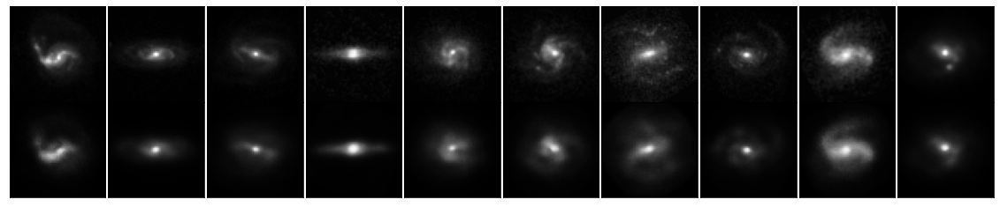

Maximal brightness 0.1906184


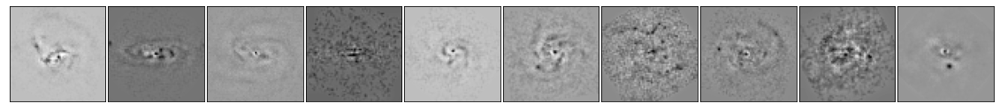

In [ ]:
present_reconstruction(models,imgs,resid=True)

Maximal brightness 1.0


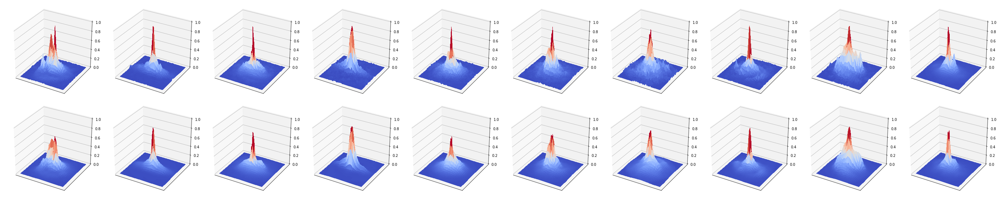

Maximal brightness 0.16582233


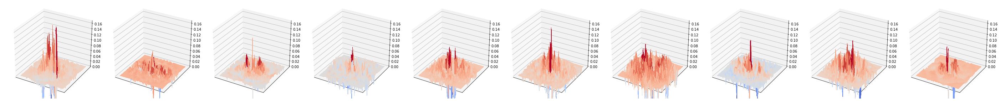

In [ ]:
present_reconstruction(models,imgs,dimensions='3d',resid=True)

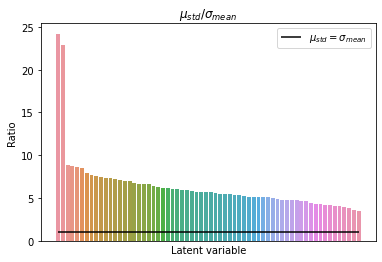

In [ ]:
latent_relation_of_variances(ratio,True)

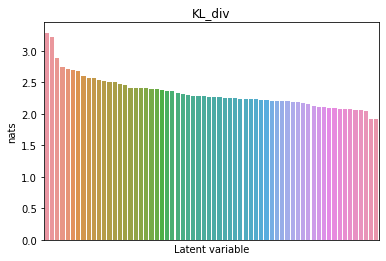

In [ ]:
DKL=DKL_per_variable(z_means,z_log_vars)

In [ ]:
dis_score,resampling_errors=disentanglement_score(models,z_means,number_of_z_to_consider=64)

In [ ]:
dis_score

0.03999999910593033

In [ ]:
resampling_errors

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,index
0,0.381631,1.241569,1.499126,0.077095,0.676367,0.249222,0.811668,1.810295,1.231620,0.814619,1.468158,1.648116,2.099764,1.553327,0.599543,0.085959,0.566840,1.353531,0.363270,0.741451,0.524562,0.150668,1.590093,0.621286,0.749515,0.805184,0.422954,1.029014,1.548263,0.334190,0.178668,0.642889,0.346968,0.184003,2.103064,0.071970,2.416859,0.304890,1.759415,0.187134,0.539194,0.789794,0.143856,1.763580,0.004167,0.982245,0.901391,0.642884,0.405428,0.615610,1.255142,0.533349,0.654633,1.551602,1.994102,2.201177,2.223310,1.527935,0.078635,0.678305,0.069416,0.383647,0.130728,1.100894,3.0
1,1.064962,1.531915,1.104994,1.479226,0.403315,0.435254,0.110062,0.166841,0.903169,0.213571,0.050091,0.300741,0.467661,0.035692,0.266053,0.713271,0.066199,0.583853,0.522027,0.693818,0.244840,1.320751,2.836503,0.482122,1.819611,0.050351,0.851419,0.816210,0.148878,1.001194,1.172087,1.105623,0.086985,0.033275,0.129736,0.095175,0.572435,1.050160,0.052813,0.138074,0.123273,0.177386,0.075607,0.970555,0.130338,1.625934,1.814839,0.885154,3.057514,0.774026,0.268167,1.846727,0.108599,0.822613,0.265660,0.515505,0.916109,0.934240,1.077717,1.209333,0.495192,0.524806,0.327762,0.739316,34.0
2,0.254075,0.846474,0.509848,0.725728,0.683286,1.098313,0.505669,1.662433,0.672243,0.637237,0.453457,0.011498,1.394770,1.815603,0.786435,1.642078,0.746827,1.470416,1.287389,1.435597,0.601167,1.538641,0.693959,0.127795,0.542858,0.910542,0.278373,0.144929,0.311309,0.515547,0.084788,0.738390,0.719086,0.971856,0.224198,0.047057,1.414092,1.493141,0.465419,1.042562,2.462865,0.999213,0.876239,1.454159,0.912159,0.975596,1.422817,1.420573,0.425964,0.240234,1.983877,1.385494,0.664351,0.408687,0.265648,0.544189,0.426569,0.173288,0.623895,0.340937,0.259592,0.113864,1.727330,1.343688,49.0
3,1.697020,1.618104,1.268630,3.414490,1.703543,0.260247,0.837315,0.339748,0.275039,0.427160,0.543084,1.062043,0.428132,0.683037,1.051609,0.218034,0.916754,0.545793,0.549235,0.043510,0.886997,1.034896,0.574698,0.816033,1.074847,0.939012,0.213952,0.846667,0.588562,0.618583,1.833528,0.201159,0.313967,0.198645,0.457624,0.315818,2.198972,0.321395,1.527631,1.630426,2.375162,1.129826,0.926982,0.055963,0.212737,1.922188,0.372071,1.521748,1.536708,0.240558,0.834503,1.230457,0.985879,2.695687,0.861587,0.236927,1.110370,0.342819,0.894867,0.786789,1.168522,1.085697,0.299836,0.452458,9.0
4,0.347928,1.962599,0.117158,0.738523,0.857680,1.325612,0.069308,0.264313,0.451523,2.349128,1.675522,1.195356,0.295221,1.109010,0.346181,1.838989,0.849370,1.018788,2.092389,0.285841,0.262759,2.826062,1.684388,0.115842,0.472478,1.817516,2.204258,0.301302,0.381400,1.880516,1.246531,0.140007,1.057481,1.474807,1.599567,0.914510,0.772712,2.723861,0.933302,1.333709,1.371535,0.215584,0.663694,0.860115,1.105757,0.476954,0.794813,0.040152,0.232400,1.124146,1.775639,0.016319,0.210905,0.913301,0.638648,0.632993,1.502780,0.238214,1.005586,0.713658,0.232005,1.901828,1.598099,0.065510,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0.462715,0.861384,0.686718,0.873087,0.604723,0.386959,0.314552,0.670418,0.906494,0.101433,0.259347,4.027611,0.901420,2.050956,0.754585,0.729797,0.396342,0.134795,1.979153,0.637652,1.211106,1.939221,1.600843,1.956377,0.667389,1.578025,0.162946,2.742969,0.005495,1.739954,0.845700,1.247573,0.336654,0.171997,0.902157,0.053568,0.382119,0.158847,0.826478,1.574625,2.240986,0.361639,2.583261,1.062752,0.176854,0.549954,0.895685,0.649414,0.689406,0.852888,0.496773,0.695183,0.009285,0.721934,1.476260,0.294306,0.874518,0.001077,0.538162,0.671120,0.143113,1.333493,0.012285,0.674531,34.0
1996,0.460993,2.629294,1.284750,0.400460,0.352724

In [ ]:
resampling_errors.groupby('index').count()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45,45
1.0,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28
2.0,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36,36
3.0,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27,27
4.0,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59.0,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34,34
60.0,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29,29
61.0,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22


In [ ]:
ratio.argmax()

7

In [ ]:
resampling_errors[resampling_errors['index']==7].describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,index
count,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.0
mean,0.641696,0.702898,0.489344,0.422679,0.446497,0.481444,0.563451,0.187985,0.560402,0.383754,0.585101,0.554159,0.912313,1.387038,0.563021,0.504972,0.606716,0.553894,0.692375,0.744258,0.517534,0.596355,0.638578,0.616663,0.564799,0.539942,0.352312,0.457486,0.567726,0.584448,0.387636,0.445966,0.450037,0.452232,0.518050,0.675932,0.418850,0.362863,0.509695,0.349759,0.526066,0.510868,0.531141,0.594101,0.441290,0.350040,0.764153,0.617832,0.427377,0.361135,0.515452,0.656158,0.413325,0.430071,0.442604,0.772237,0.289607,0.595231,0.643528,0.534513,0.694119,0.638229,0.417794,0.610384,7.0
std,0.452934,0.522711,0.298610,0.251935,0.305349,0.345509,0.517691,0.132734,0.391615,0.274952,0.375307,0.448313,0.444678,1.160014,0.482841,0.388427,0.417981,0.541708,0.564488,0.487856,0.408534,0.395941,0.386316,0.464535,0.449524,0.391016,0.299285,0.325221,0.416460,0.409833,0.363425,0.270038,0.429960,0.364352,0.357291,0.482707,0.395346,0.292227,0.370253,0.211084,0.414939,0.482052,0.369940,0.447948,0.389639,0.344782,0.558279,0.411481,0.330852,0.325062,0.450839,0.454831,0.308614,0.269571,0.385937,0.454539,0.232921,0.473086,0.355877,0.394154,0.501957,0.487645,0.316339,0.482714,0.0
min,0.029691,0.056779,0.064260,0.001354,0.010127,0.041307,0.009262,0.006805,0.013476,0.024587,0.042637,0.006893,0.259362,0.005972,0.002378,0.064335,0.042532,0.001112,0.018270,0.020621,0.037633,0.016904,0.056107,0.017529,0.041852,0.031564,0.009767,0.007086,0.020961,0.028817,0.011848,0.024109,0.051517,0.010366,0.002453,0.102167,0.031604,0.022888,0.016491,0.022882,0.007284,0.035407,0.055066,0.010174,0.002299,0.035523,0.009772,0.040602,0.028970,0.017691,0.043265,0.010287,0.026370,0.053403,0.006607,0.027478,0.021570,0.016931,0.014586,0.064338,0.045805,0.004036,0.017036,0.011061,7.0
25%,0.269298,0.331896,0.295121,0.213287,0.255897,0.219349,0.240198,0.078826,0.295232,0.151711,0.355375,0.174427,0.576835,0.306350,0.227423,0.276139,0.351531,0.192362,0.312140,0.403363,0.201413,0.251227,0.399399,0.276421,0.127311,0.273534,0.103824,0.252878,0.255643,0.240347,0.066193,0.242347,0.132247,0.173986,0.262781,0.264014,0.150742,0.103051,0.171585,0.191150,0.145310,0.167739,0.281523,0.331380,0.132281,0.093735,0.320389,0.197521,0.154155,0.093119,0.178772,0.271425,0.154539,0.251591,0.166282,0.455476,0.096555,0.193914,0.398183,0.222043,0.317761,0.202214,0.219621,0.241197,7.0
50%,0.613865,0.571232,0.458720,0.425586,0.406485,0.413763,0.481727,0.185238,0.499438,0.331014,0.565364,0.458122,0.892085,1.075286,0.456868,0.395919,0.567804,0.393845,0.585618,0.648811,0.481831,0.598630,0.573422,0.545737,0.466348,0.447802,0.263034,0.365403,0.516761,0.559761,0.294882,0.404571,0.263542,0.351851,0.478880,0.547215,0.318234,0.248804,0.512888,0.362709,0.491628,0.310829,0.504781,0.487292,0.296927,0.255684,0.660228,0.671743,0.300035,0.309522,0.436379,0.681495,0.314695,0.397807,0.375260,0.690580,0.266875,0.540785,0.687144,0.397815,0.654439,0.666796,0.329634,0.531457,7.0
75%,0.912730,0.953409,0.628786,0.581477,0.557045,0.639317,0.659636,0.278641,0.878388,0.546776,0.771322,0.818440,1.212475,2.146960,0.785687,0.595090,0.787049,0.648540,0.973384,1.021962,0.618247,0.839447,0.851516,0.881127,0.914404,0.801261,0

In [ ]:
variables_to_consider

array([ 7, 13])

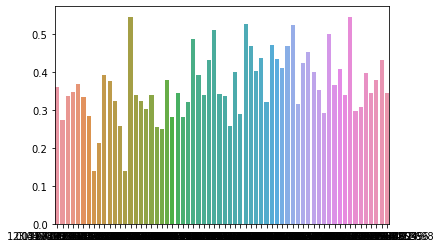

In [ ]:
rel_err=pd.Series(np.diag(resampling_errors.groupby('index').mean()),index=resampling_errors.columns[:-1])
sns.barplot(x=np.linspace(0,64,64),y=rel_err)

In [ ]:
ratio.argsort()[::-1]

array([ 7, 13, 46, 35, 12, 55, 19, 58, 57, 51, 22, 20, 16, 40,  1, 33, 18,
        0,  6, 60,  3, 24,  4, 50, 61,  5, 15, 21, 28,  8, 47, 17,  2, 25,
       32, 11, 38, 63, 23, 48, 14, 26, 10, 29, 41, 54, 43, 30, 49, 34, 31,
       53, 27, 62,  9, 44, 36, 37, 52, 42, 39, 59, 45, 56])

Maximal brightness 0.8931786


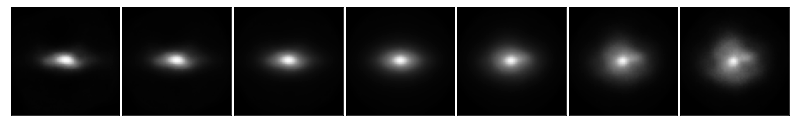

Maximal brightness 0.9395763


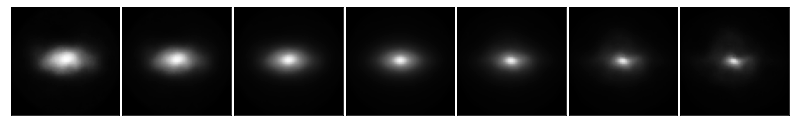

Maximal brightness 0.91421545


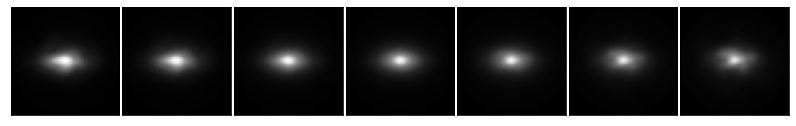

Maximal brightness 0.8551342


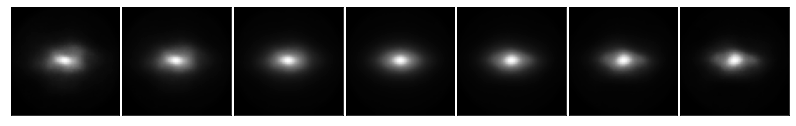

In [ ]:
galaxy_properties_from_latent_variables(models,z_means,number_of_z_to_consider=4,sort_array=ratio)

In [ ]:
DKL.numpy().argsort()[::-1]

array([ 7, 13, 35, 50, 61, 46, 58, 45, 33, 15, 60,  8, 40, 16, 54, 51, 22,
       37, 12, 47, 27, 32, 28, 34, 23, 11, 53, 55, 57,  1, 19, 42, 18, 20,
       38, 39,  3, 48, 30,  2,  4,  6,  5, 63, 29,  9, 52, 26, 24, 25, 10,
       49,  0, 31, 21, 17, 43, 14, 44, 36, 62, 41, 59, 56])

Maximal brightness 0.8931786


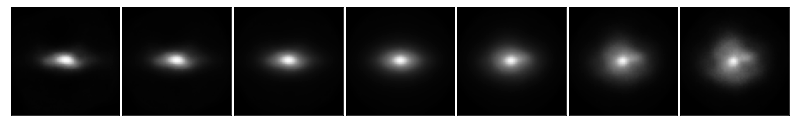

Maximal brightness 0.9395763


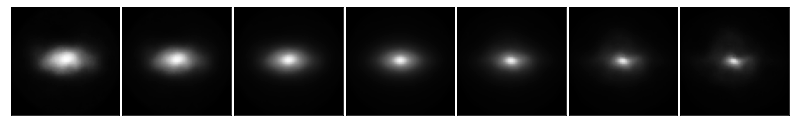

Maximal brightness 0.8551342


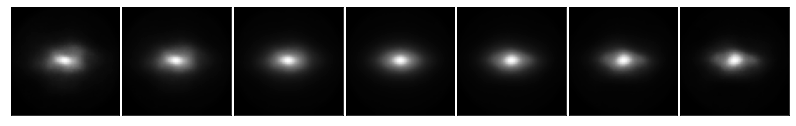

In [ ]:
galaxy_properties_from_latent_variables(models,z_means,number_of_z_to_consider=3,sort_array=DKL)

Maximal brightness 0.97221935


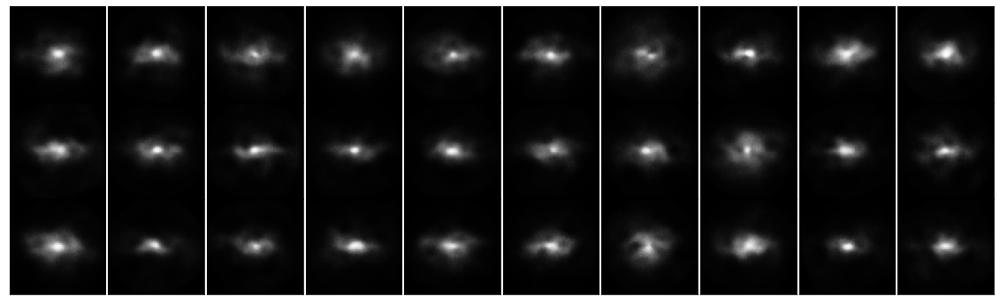

In [ ]:
sample_random_images(models,z_means)

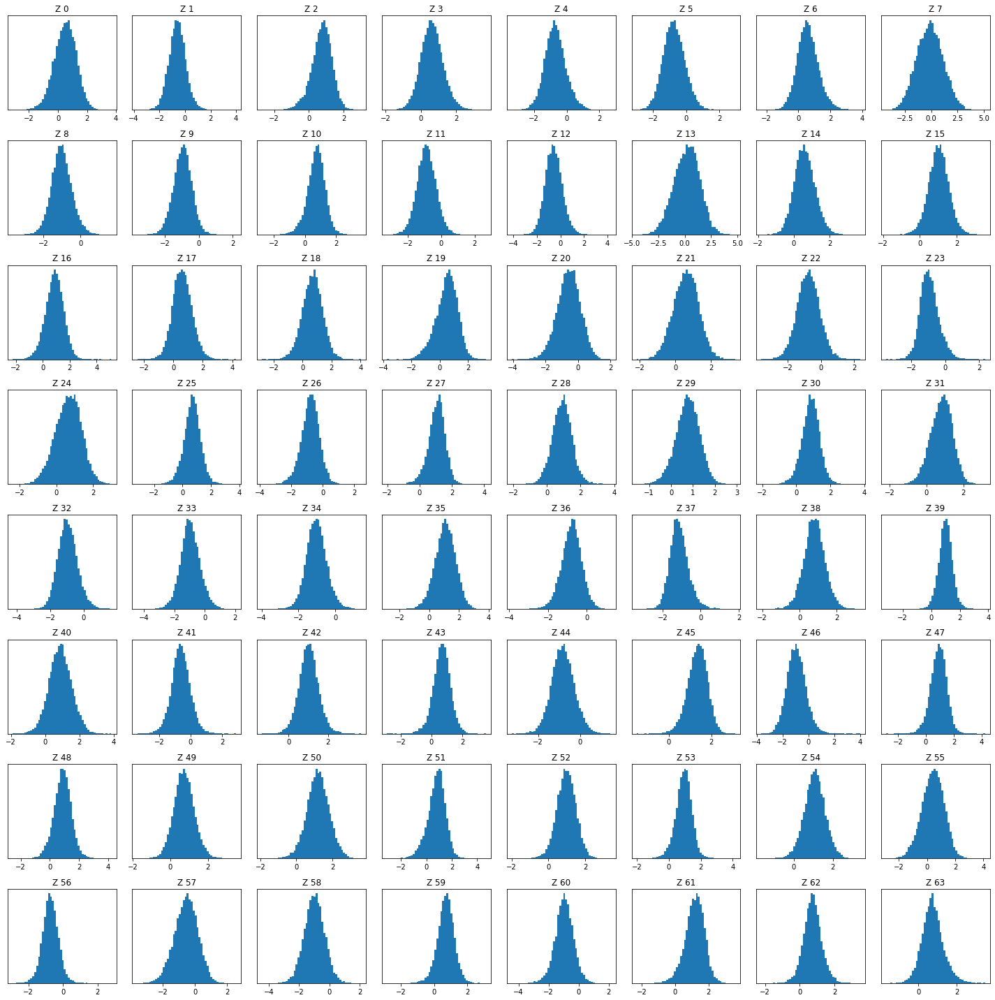

In [ ]:
latent_distribution(z_means)

## Softplus

### Chi_sq Poisson Beta=1e-3

In [ ]:
beta_vae=1e-3
activation='softplus'
loss_type='chi_sq'
models,model_loss_function,reconstruction_loss_function=get_Neural_Network(beta_vae,activation,loss_type)

Checkpoint_to_load=320
Checkpoints_Folder=Folder+'Models/Softplus_chisq_Poisson_beta=0.001/'
models['vae'].load_weights(Checkpoints_Folder+'epoch_{}/Model'.format(Checkpoint_to_load))

z_means=models['z_meaner'].predict(gal_dataset_images)
z_log_vars=models['z_log_varer'].predict(gal_dataset_images)
decoded=models['vae'].predict(gal_dataset_images)
std_of_mu=z_means.std(axis=0)
mean_of_var=(np.exp(z_log_vars/2)).mean(axis=0)
ratio=std_of_mu/mean_of_var

In [ ]:
Max_values=decoded.max(axis=(1,2,3))
Min_values=decoded.min(axis=(1,2,3))
chi_squared=chi_sq(gal_dataset_images,decoded)

print('chi_sq values {:.5f} ± {:.5f}, median {:.5f}'.format(chi_squared.mean(),chi_squared.std(),np.median(chi_squared)))
SSIM_stats=tf.image.ssim(gal_dataset_images.astype('double'), decoded.astype('double'),max_val=1,filter_size=8).numpy()
print('SSIM {:.3f} ± {:.3f}, median {:.3f}'.format(SSIM_stats.mean(),SSIM_stats.std(),np.median(SSIM_stats)))

print('Max values {:.3f} ± {:.3f}, median {:.3f}'.format(Max_values.mean(),Max_values.std(),np.median(Max_values)))
print('Min values {:.5f} ± {:.5f}, median {:.5f}'.format(Min_values.mean(),Min_values.std(),np.median(Min_values)))

KL_loss=K.eval(0.5 * K.sum(K.exp(z_log_vars)+K.square(z_means)-1-z_log_vars, axis=-1))
print('KL div {:.2f}±{:.2f}'.format(KL_loss.mean(),KL_loss.std()))

chi_sq values 7.84304 ± 4.78172, median 7.16240
SSIM 0.729 ± 0.133, median 0.723
Max values 0.941 ± 0.075, median 0.958
Min values 0.00001 ± 0.00000, median 0.00001
KL div 239.29±19.63


Maximal brightness 1.0059884


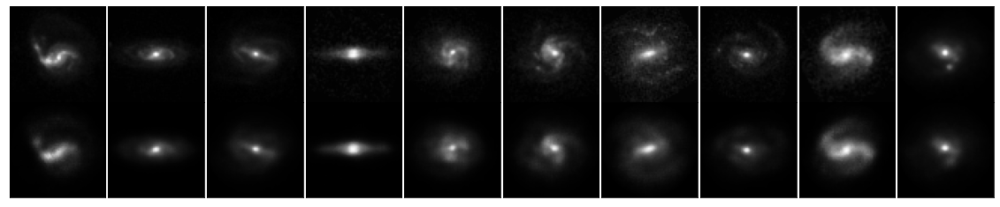

Maximal brightness 0.17752591


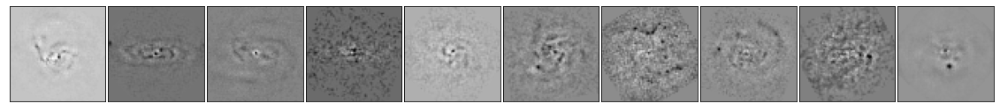

In [ ]:
present_reconstruction(models,imgs,resid=True)

Maximal brightness 1.0


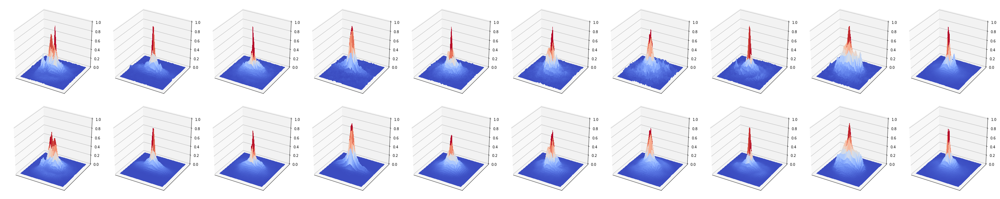

Maximal brightness 0.17616478


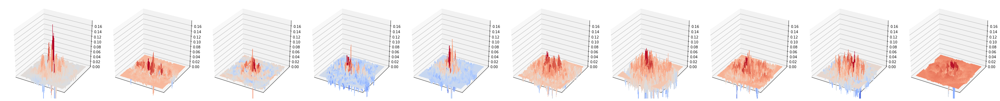

In [ ]:
present_reconstruction(models,imgs,dimensions='3d',resid=True)

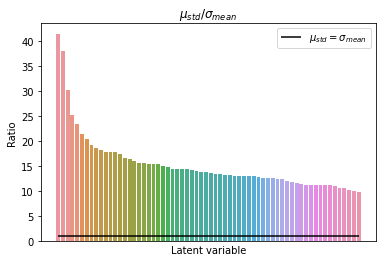

In [ ]:
latent_relation_of_variances(ratio,True)

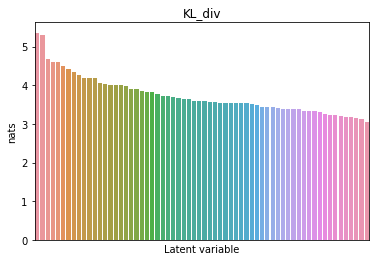

In [ ]:
DKL=DKL_per_variable(z_means,z_log_vars)

In [ ]:
dis_score,resampling_error=disentanglement_score(models,z_means,number_of_z_to_consider=64)


  3%|▎         | 54/2000 [00:03<02:17, 14.17it/s]


100%|██████████| 2000/2000 [02:29<00:00, 13.36it/s]


25/25 [==============================] - 0s 1ms/step - loss: 4.7968 - accuracy: 0.0300


In [ ]:
dis_score

0.029999999329447746

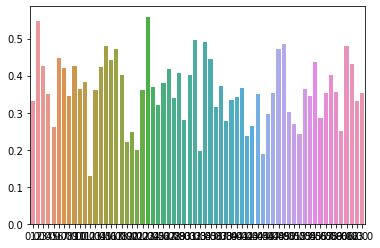

In [ ]:
sns.barplot(x=np.linspace(0,63,64),y=np.diag(resampling_error.groupby('index').mean())[np.argsort(DKL)[::-1]])

Maximal brightness 0.95647013


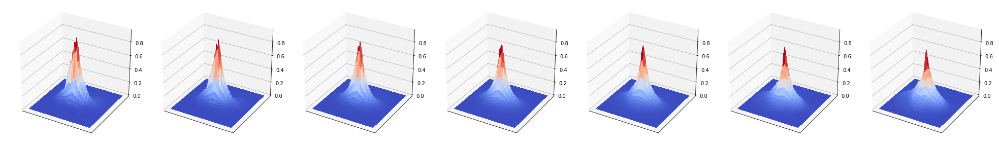

Maximal brightness 1.0134094


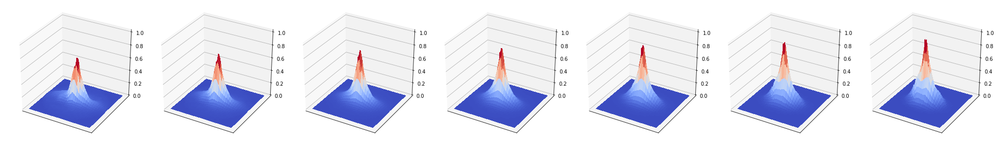

Maximal brightness 1.0195258


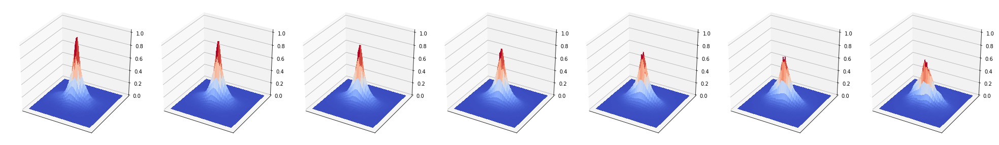

In [ ]:
  galaxy_properties_from_latent_variables(models,z_means,number_of_z_to_consider=3,dimensions='3d')

Maximal brightness 0.9564703


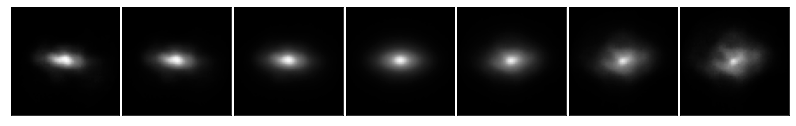

Maximal brightness 1.0134094


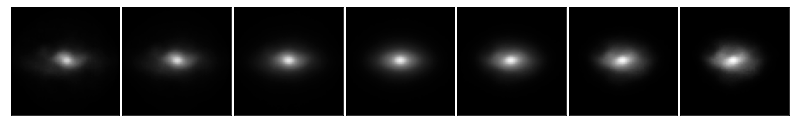

Maximal brightness 1.0195255


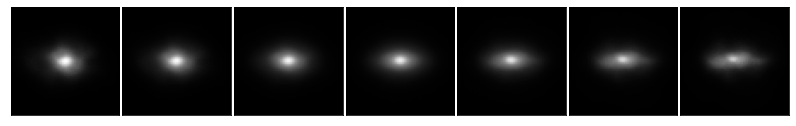

Maximal brightness 0.8858042


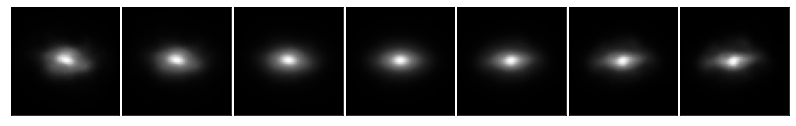

Maximal brightness 0.9385297


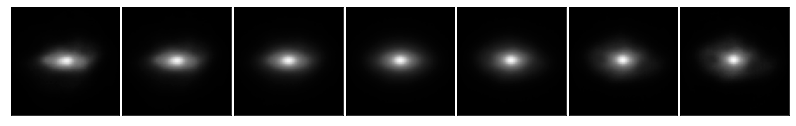

Maximal brightness 0.9030368


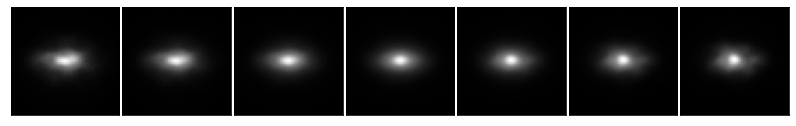

Maximal brightness 0.88642025


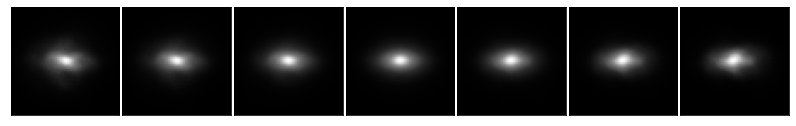

Maximal brightness 0.9093964


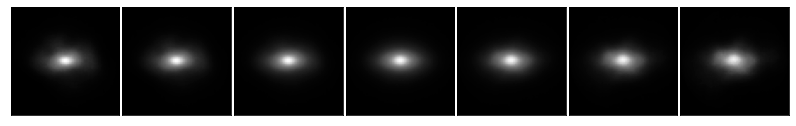

Maximal brightness 0.92786187


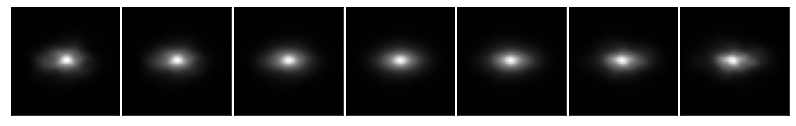

Maximal brightness 0.87834895


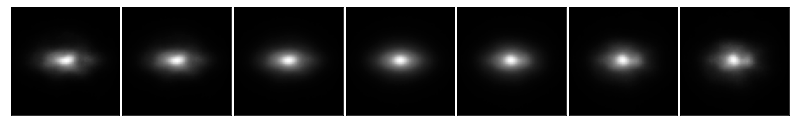

In [ ]:
galaxy_properties_from_latent_variables(models,z_means,number_of_z_to_consider=10)

Maximal brightness 1.115665


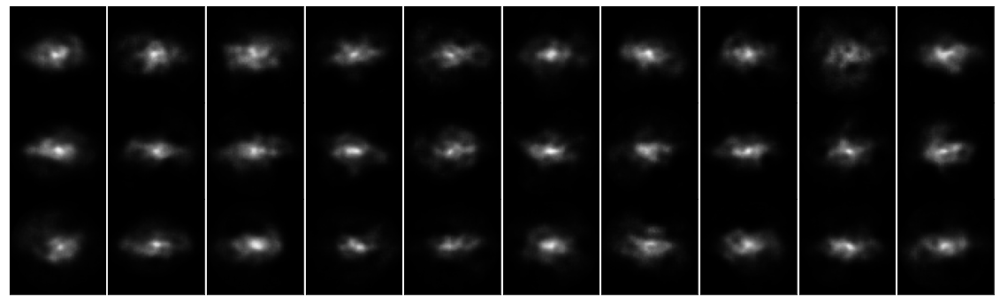

In [ ]:
sample_random_images(models,z_means)

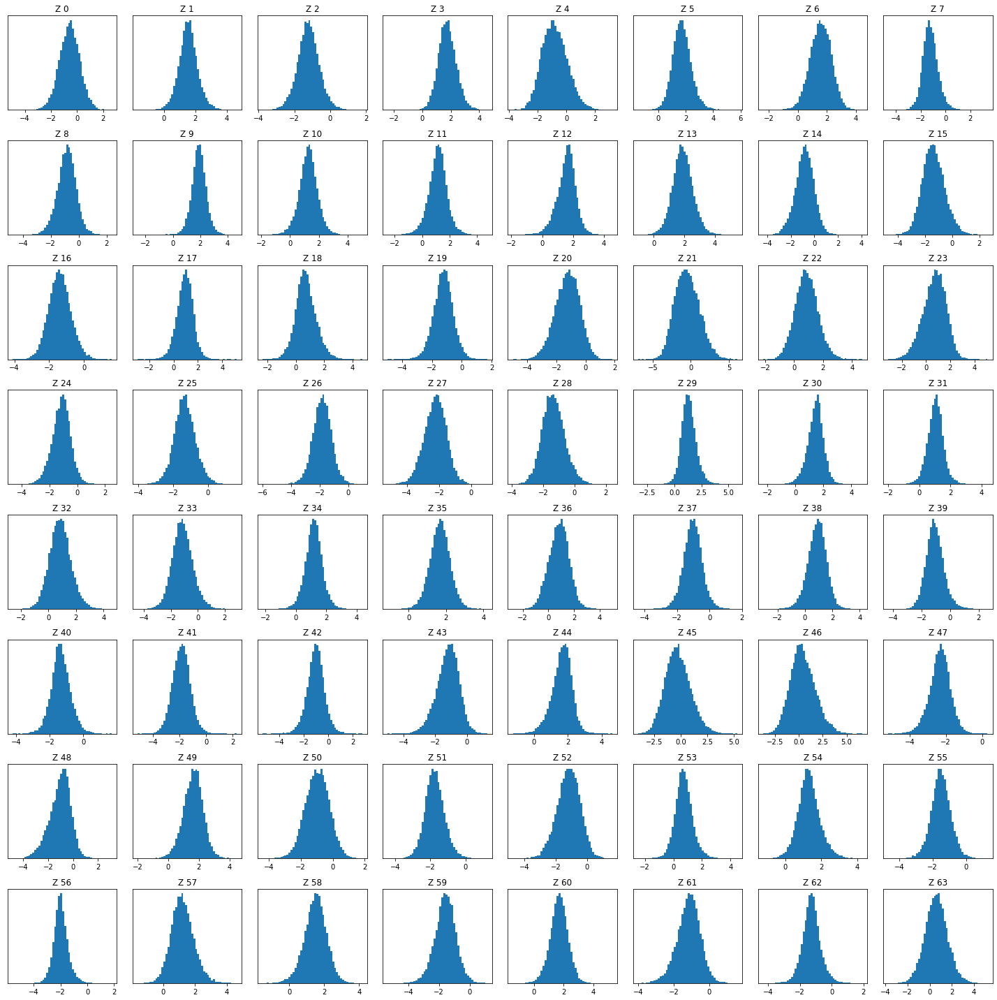

In [ ]:
latent_distribution(z_means)

### Chi_sq Poisson Beta=0.5*1e-2

In [ ]:
beta_vae=0.5*1e-2
activation='softplus'
loss_type='chi_sq'
models,model_loss_function,reconstruction_loss_function=get_Neural_Network(beta_vae,activation,loss_type)

Checkpoint_to_load=160
Checkpoints_Folder=Folder+'Models/Softplus_chisq_beta=0.5*1e-2_lr=1e-6/'
models['vae'].load_weights(Checkpoints_Folder+'epoch_{}/Model'.format(Checkpoint_to_load))

z_means=models['z_meaner'].predict(gal_dataset_images)
z_log_vars=models['z_log_varer'].predict(gal_dataset_images)
decoded=models['vae'].predict(gal_dataset_images)
std_of_mu=z_means.std(axis=0)
mean_of_var=(np.exp(z_log_vars/2)).mean(axis=0)
ratio=std_of_mu/mean_of_var

In [ ]:
Max_values=decoded.max(axis=(1,2,3))
Min_values=decoded.min(axis=(1,2,3))
chi_squared=np.zeros(len(gal_dataset_images))
for i,image_true in enumerate(gal_dataset_images):
  chi_squared[i]=Image_Stats.chi_sq(image_true[:,:,0],decoded[i,:,:,0])

print('chi_sq values {:.5f} ± {:.5f}, median {:.5f}'.format(chi_squared.mean(),chi_squared.std(),np.median(chi_squared)))
SSIM_stats=tf.image.ssim(gal_dataset_images.astype('double'), decoded.astype('double'),max_val=1,filter_size=8).numpy()
print('SSIM {:.3f} ± {:.3f}, median {:.3f}'.format(SSIM_stats.mean(),SSIM_stats.std(),np.median(SSIM_stats)))

print('Max values {:.3f} ± {:.3f}, median {:.3f}'.format(Max_values.mean(),Max_values.std(),np.median(Max_values)))
print('Min values {:.5f} ± {:.5f}, median {:.5f}'.format(Min_values.mean(),Min_values.std(),np.median(Min_values)))

chi_sq values 166.95835 ± 265.84148, median 114.66361
SSIM 0.722 ± 0.131, median 0.719
Max values 0.904 ± 0.105, median 0.924
Min values 0.00005 ± 0.00001, median 0.00005


Maximal brightness 1.0464334


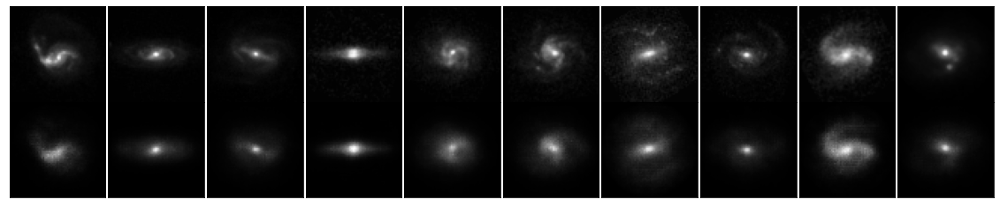

Maximal brightness 0.20368889


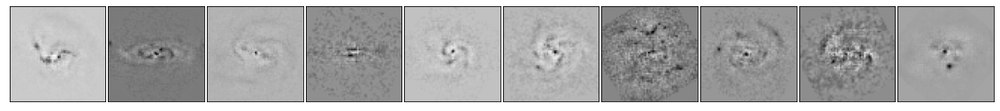

In [ ]:
present_reconstruction(models,imgs,resid=True)

Maximal brightness 1.0742137


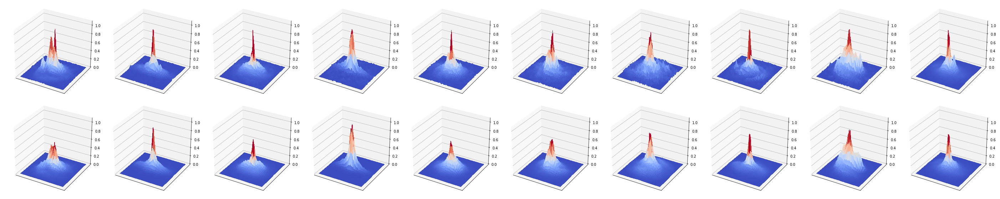

Maximal brightness 0.16967621


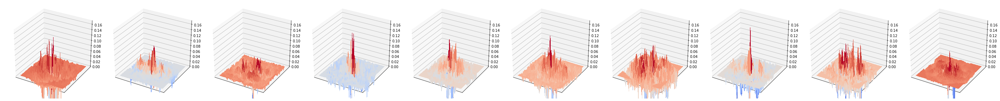

In [ ]:
present_reconstruction(models,imgs,dimensions='3d',resid=True)

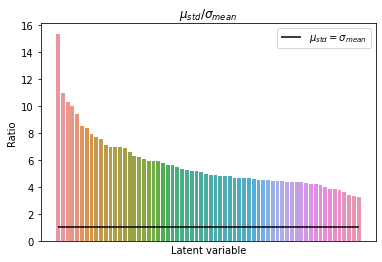

In [ ]:
latent_relation_of_variances(ratio,True)

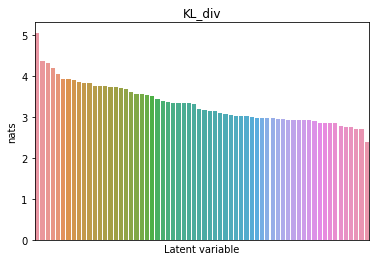

In [ ]:
DKL=DKL_per_variable(z_means,z_log_vars)

In [ ]:
DKL[39]

<tf.Tensor: shape=(), dtype=float32, numpy=3.3464355>

In [ ]:
DKL[49]

<tf.Tensor: shape=(), dtype=float32, numpy=5.0479383>

In [ ]:
K.eval(DKL).argmax()

49

In [ ]:
ratio.argmax()

39

Maximal brightness 0.82135874


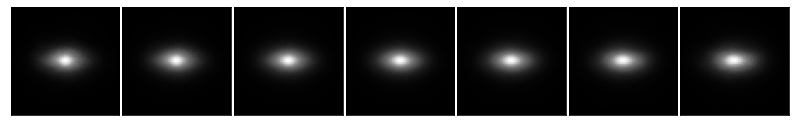

Maximal brightness 0.834153


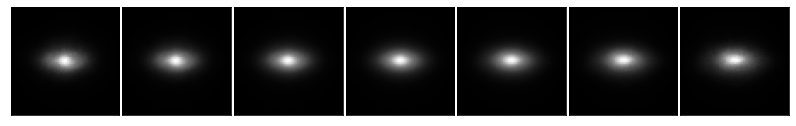

Maximal brightness 0.8925674


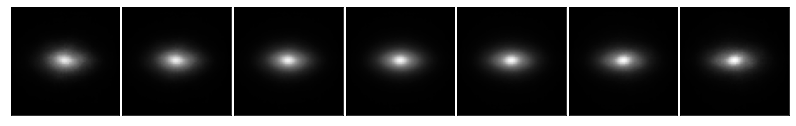

In [ ]:
galaxy_properties_from_latent_variables(models,z_means,number_of_z_to_consider=3,sort_array=DKL)

Maximal brightness 0.86434674


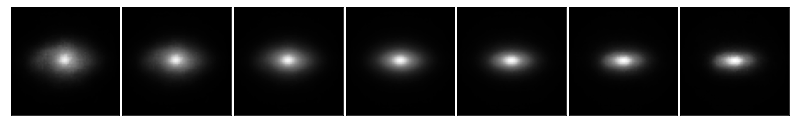

Maximal brightness 0.94063085


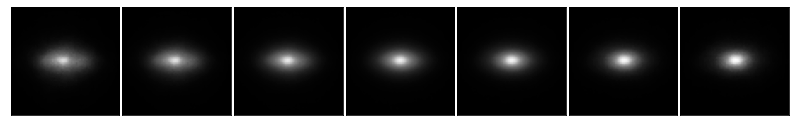

Maximal brightness 0.8603335


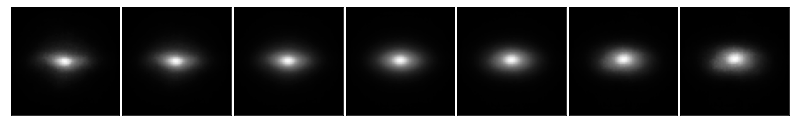

In [ ]:
galaxy_properties_from_latent_variables(models,z_means,number_of_z_to_consider=3,sort_array=ratio)

Maximal brightness 1.0969129


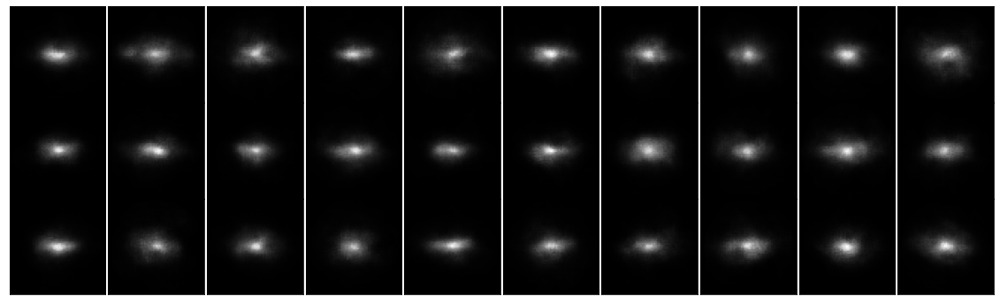

In [ ]:
sample_random_images(models,z_means)

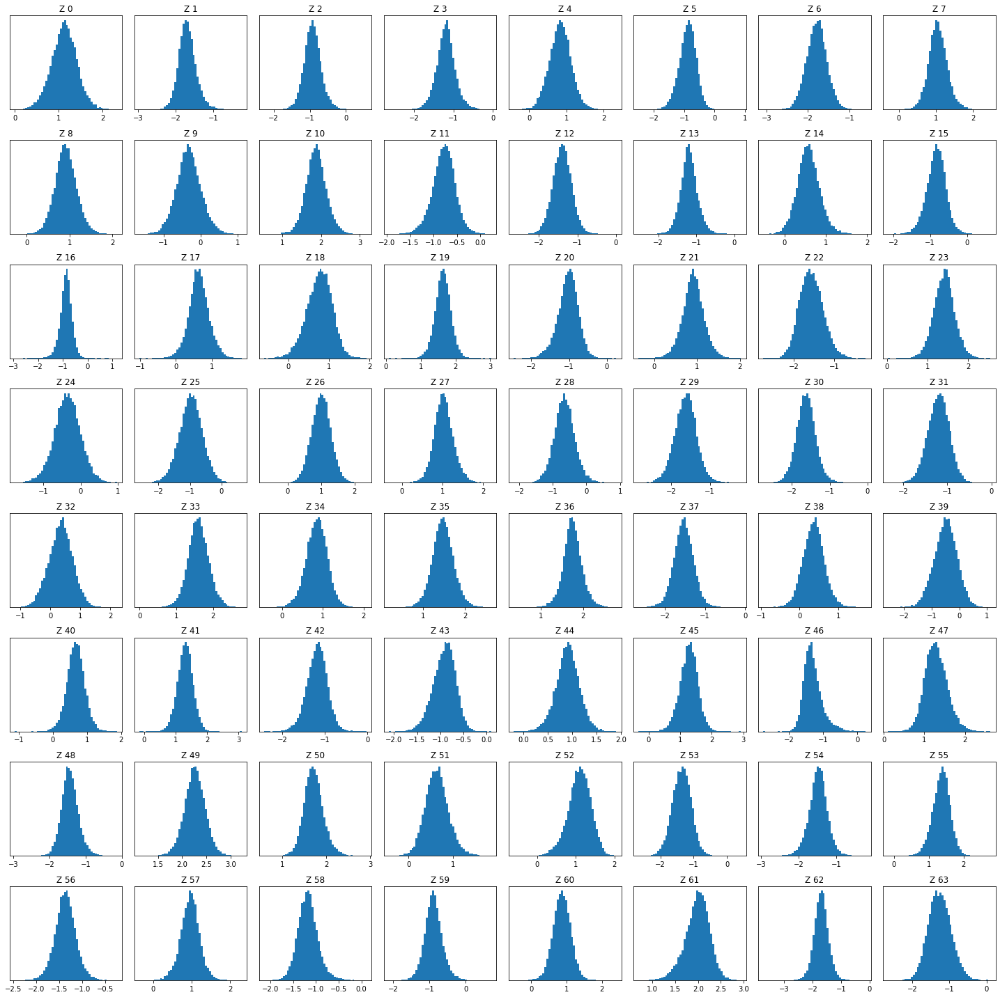

In [ ]:
latent_distribution(z_means)

### Chi_sq Poisson Beta=1e-2

In [ ]:
beta_vae=1e-2
activation='softplus'
loss_type='chi_sq'
models,model_loss_function,reconstruction_loss_function=get_Neural_Network(beta_vae,activation,loss_type)

Checkpoint_to_load=100
Checkpoints_Folder=Folder+'Models/Softplus_chisq_beta=1e-2_lr=1e-6/'
models['vae'].load_weights(Checkpoints_Folder+'epoch_{}/Model'.format(Checkpoint_to_load))

z_means=models['z_meaner'].predict(gal_dataset_images)
z_log_vars=models['z_log_varer'].predict(gal_dataset_images)
decoded=models['vae'].predict(gal_dataset_images)
std_of_mu=z_means.std(axis=0)
mean_of_var=(np.exp(z_log_vars/2)).mean(axis=0)
ratio=std_of_mu/mean_of_var

In [ ]:
Max_values=decoded.max(axis=(1,2,3))
Min_values=decoded.min(axis=(1,2,3))
chi_squared=np.zeros(len(gal_dataset_images))
for i,image_true in enumerate(gal_dataset_images):
  chi_squared[i]=Image_Stats.chi_sq(image_true[:,:,0],decoded[i,:,:,0])

print('chi_sq values {:.5f} ± {:.5f}, median {:.5f}'.format(chi_squared.mean(),chi_squared.std(),np.median(chi_squared)))
SSIM_stats=tf.image.ssim(gal_dataset_images.astype('double'), decoded.astype('double'),max_val=1,filter_size=8).numpy()
print('SSIM {:.3f} ± {:.3f}, median {:.3f}'.format(SSIM_stats.mean(),SSIM_stats.std(),np.median(SSIM_stats)))

print('Max values {:.3f} ± {:.3f}, median {:.3f}'.format(Max_values.mean(),Max_values.std(),np.median(Max_values)))
print('Min values {:.5f} ± {:.5f}, median {:.5f}'.format(Min_values.mean(),Min_values.std(),np.median(Min_values)))

chi_sq values 318.08339 ± 374.51480, median 241.02631
SSIM 0.736 ± 0.128, median 0.736
Max values 0.866 ± 0.121, median 0.884
Min values 0.00012 ± 0.00002, median 0.00012


Maximal brightness 1.1023057


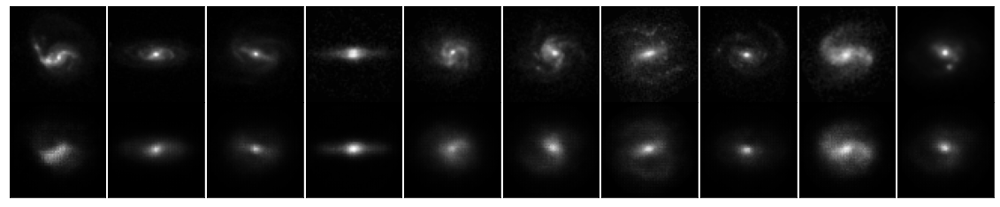

Maximal brightness 0.27589467


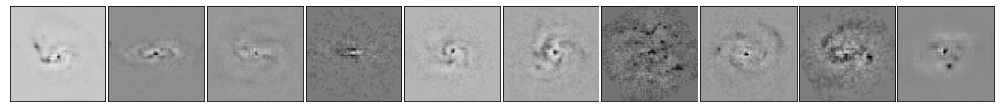

In [ ]:
present_reconstruction(models,imgs,resid=True)

Maximal brightness 1.0863463


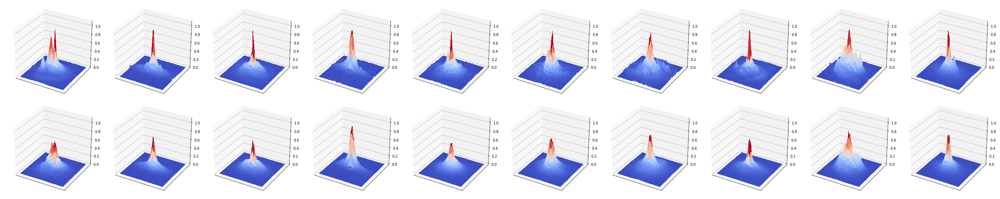

Maximal brightness 0.23630437


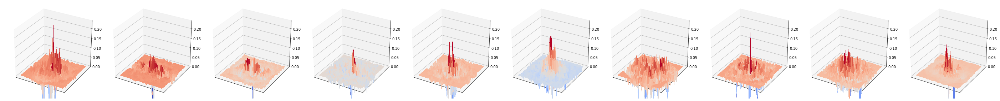

In [ ]:
present_reconstruction(models,imgs,dimensions='3d',resid=True)

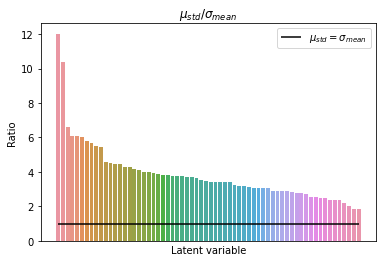

In [ ]:
latent_relation_of_variances(ratio,True)

Maximal brightness 0.84499955


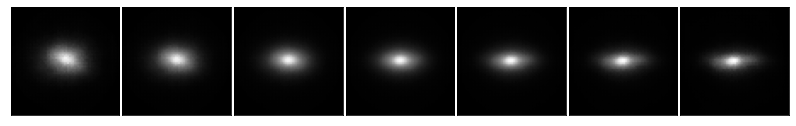

Maximal brightness 0.81810856


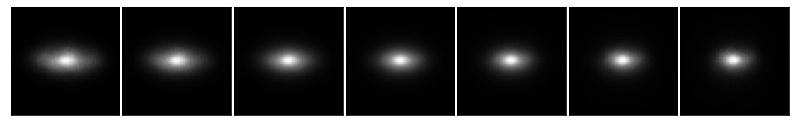

Maximal brightness 0.8529845


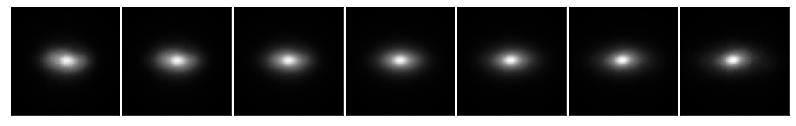

Maximal brightness 0.83471966


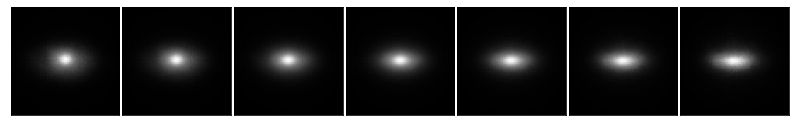

Maximal brightness 0.8988756


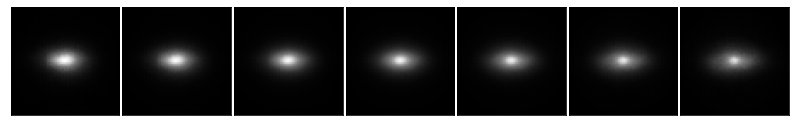

Maximal brightness 0.822791


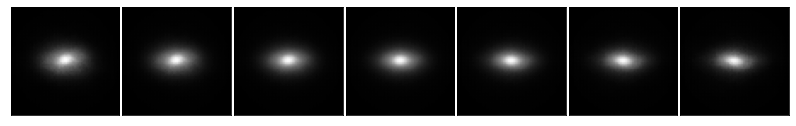

Maximal brightness 0.87413013


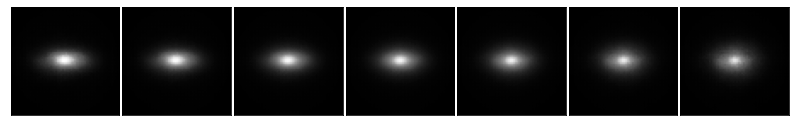

Maximal brightness 0.8350485


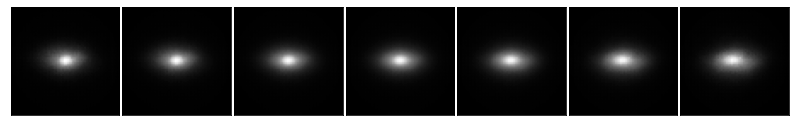

Maximal brightness 0.8844096


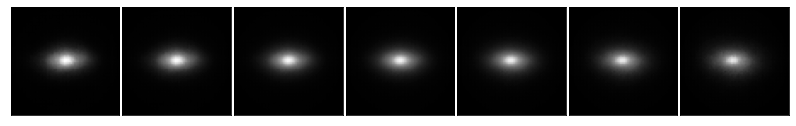

Maximal brightness 0.8860579


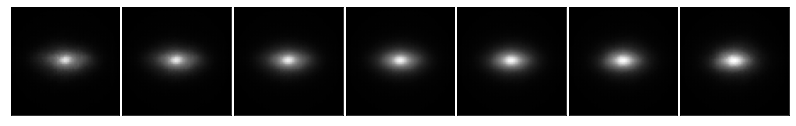

In [ ]:
galaxy_properties_from_latent_variables(models,z_means,number_of_z_to_consider=10)

Maximal brightness 0.9096327


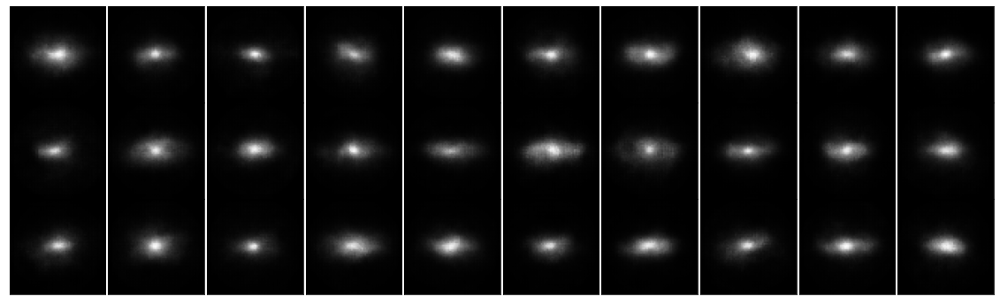

In [ ]:
sample_random_images(models,z_means)

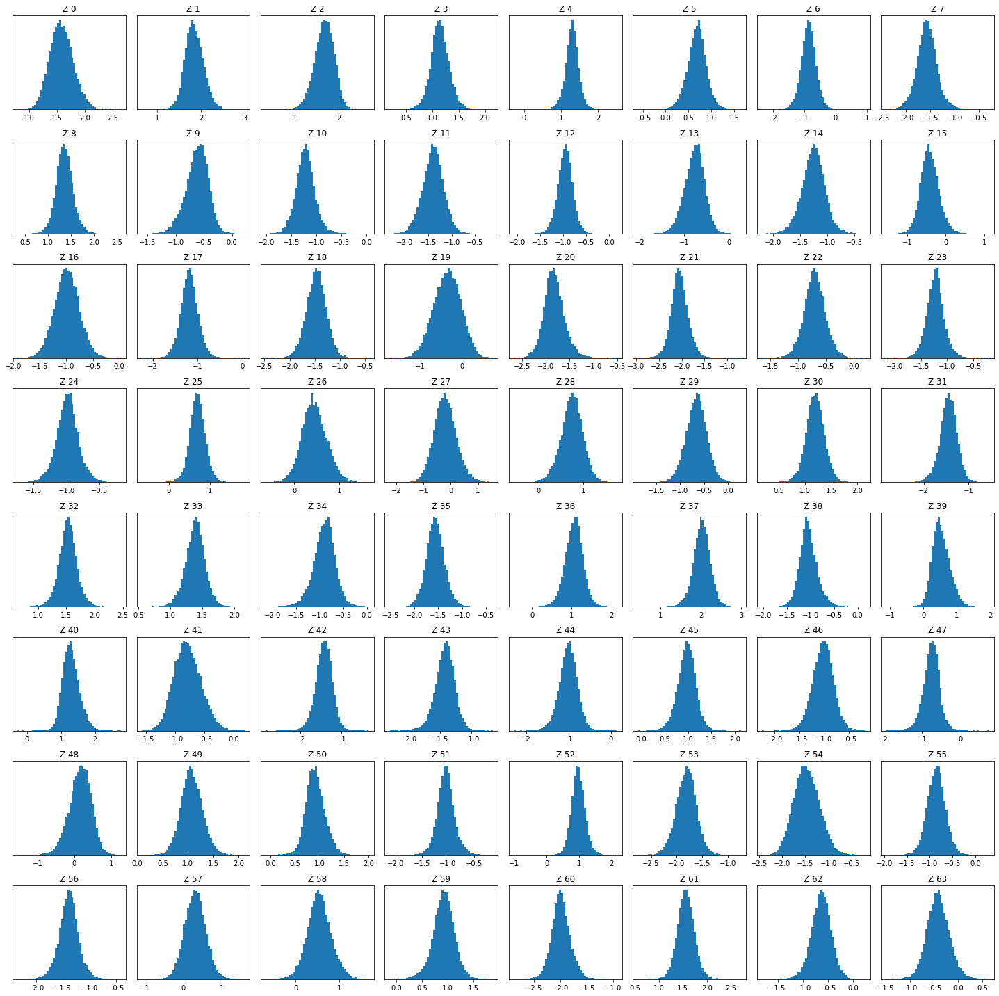

In [ ]:
latent_distribution(z_means)

## Capacity Control

### Sigmoid_BCE_beta=1e-2

In [39]:
beta_vae=1e-2
gamma=None
Start_Capacity=3
Capacity_speed=1
activation='sigmoid'
loss_type='binary_crossentropy'
models,model_loss_function,reconstruction_loss_function,regularization_loss_function=get_Neural_Network(beta_vae,activation,loss_type,gamma)

Checkpoint_to_load=125
Checkpoint_name='Models/Capacity_control/BCE_Sigmoid_test/'
Checkpoints_Folder=Folder+Checkpoint_name

Capacity=Start_Capacity+(Checkpoint_to_load)*Capacity_speed
models['vae'].load_weights(Checkpoints_Folder+'epoch_{}/Model'.format(Checkpoint_to_load))

z_means=models['z_meaner'].predict(gal_dataset_images)
z_log_vars=models['z_log_varer'].predict(gal_dataset_images)
decoded=models['vae'].predict(gal_dataset_images)
std_of_mu=z_means.std(axis=0)
mean_of_var=(np.exp(z_log_vars/2)).mean(axis=0)
ratio=std_of_mu/mean_of_var

0 99 126


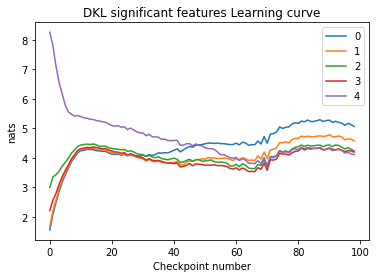

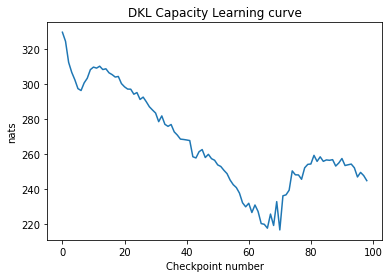

In [40]:
DKL_learning_curve(Checkpoints_Folder+'DKL.txt')

### gamma=1e+3 Start_C=10 Speed_2_per_epoch

In [89]:
beta_vae=1
activation='softplus'
loss_type='chi_sq'
models,model_loss_function,reconstruction_loss_function=get_Neural_Network(beta_vae,activation,loss_type)

Checkpoint_to_load=70
Checkpoints_Folder=Folder+'Models/Softplus_chisq_Capacity_control/gamma=1e+3_Start_C=10_Speed_2_per_epoch_clipvalue=1/'
models['vae'].load_weights(Checkpoints_Folder+'epoch_{}/Model'.format(Checkpoint_to_load))

z_means=models['z_meaner'].predict(gal_dataset_images)
z_log_vars=models['z_log_varer'].predict(gal_dataset_images)
decoded=models['vae'].predict(gal_dataset_images)
std_of_mu=z_means.std(axis=0)
mean_of_var=(np.exp(z_log_vars/2)).mean(axis=0)
ratio=std_of_mu/mean_of_var

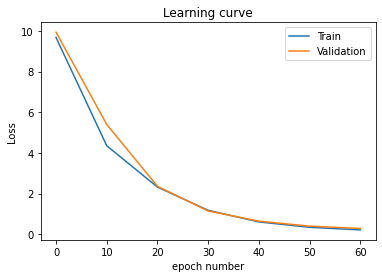

In [25]:
Visual_analysis.learning_curve(Checkpoints_Folder+'logs.txt',np.maximum(Checkpoint_to_load-200,0),Checkpoint_to_load)

Maximal brightness 1.0


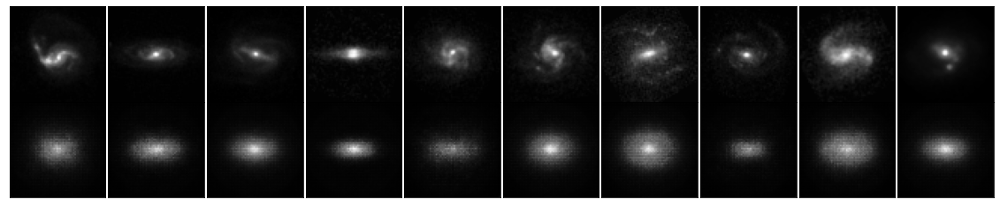

In [26]:
present_reconstruction(models,imgs,resid=False)

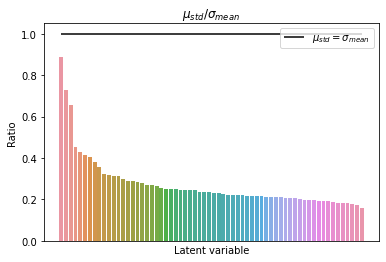

In [27]:
latent_relation_of_variances(ratio,True)

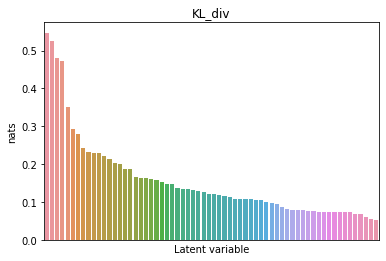

In [88]:
DKL=DKL_per_variable(z_means,z_log_vars)

0 10 10


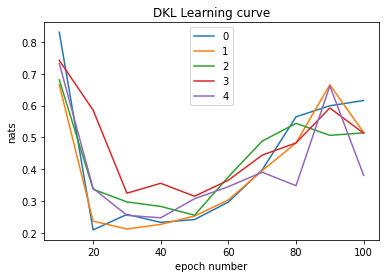

In [92]:
DKL_learning_curve(Checkpoints_Folder+'DKL.txt')

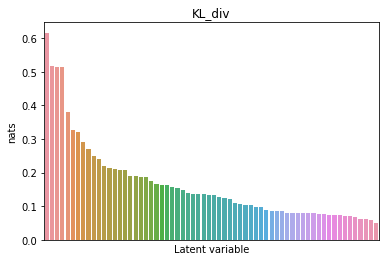

In [109]:
_=show_DKL(Checkpoints_Folder+'DKL.txt')

Maximal brightness 0.8058267


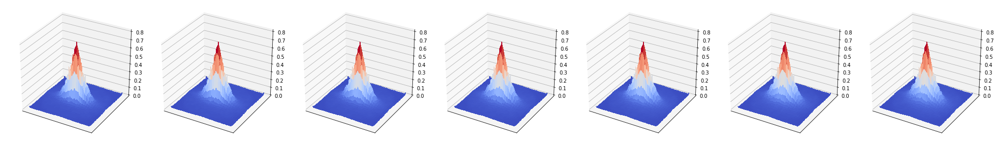

Maximal brightness 0.82523745


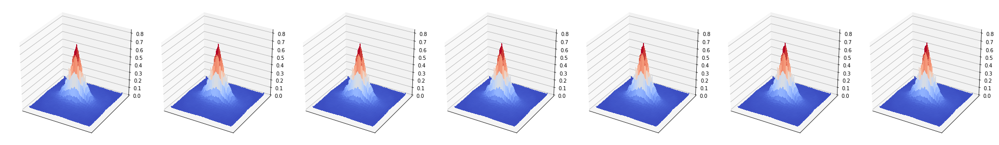

Maximal brightness 0.83131576


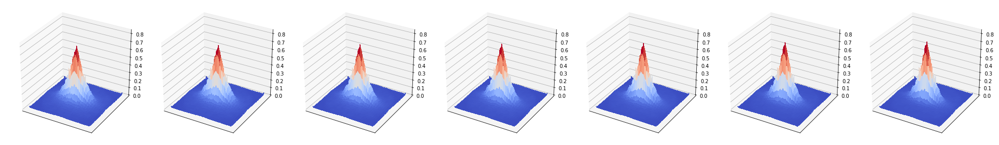

Maximal brightness 0.8157596


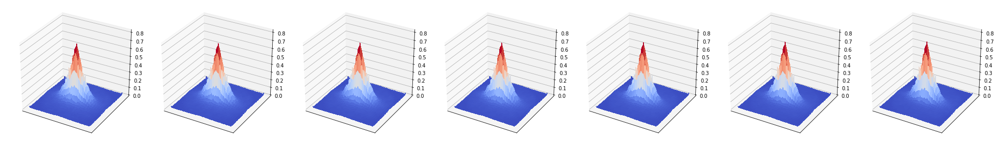

In [111]:
galaxy_properties_from_latent_variables(models,z_means,number_of_z_to_consider=4,sort_array=DKL,dimensions='3d')

### gamma=1e+3 Start_C=10 Speed_1_per_epoch

In [112]:
beta_vae=1
activation='softplus'
loss_type='chi_sq'
models,model_loss_function,reconstruction_loss_function=get_Neural_Network(beta_vae,activation,loss_type)

Checkpoint_to_load=180
Checkpoints_Folder=Folder+'Models/Softplus_chisq_Capacity_control/gamma=1e+3_Start_C=10_Speed_1_per_epoch_clipvalue=1/'
models['vae'].load_weights(Checkpoints_Folder+'epoch_{}/Model'.format(Checkpoint_to_load))

z_means=models['z_meaner'].predict(gal_dataset_images)
z_log_vars=models['z_log_varer'].predict(gal_dataset_images)
decoded=models['vae'].predict(gal_dataset_images)
std_of_mu=z_means.std(axis=0)
mean_of_var=(np.exp(z_log_vars/2)).mean(axis=0)
ratio=std_of_mu/mean_of_var

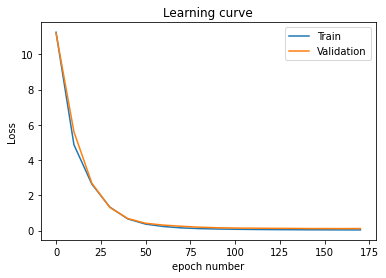

In [21]:
Visual_analysis.learning_curve(Checkpoints_Folder+'logs.txt',np.maximum(Checkpoint_to_load-200,0),Checkpoint_to_load)

0 21 21


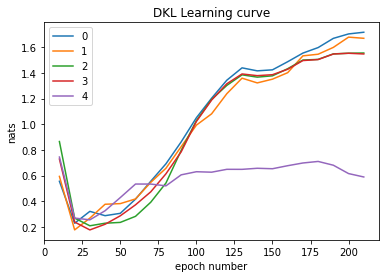

In [116]:
DKL_learning_curve(Checkpoints_Folder+'DKL.txt')

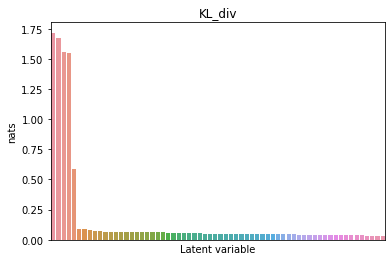

10.21741787


In [142]:
_=show_DKL(Checkpoints_Folder+'DKL.txt')

Maximal brightness 1.0


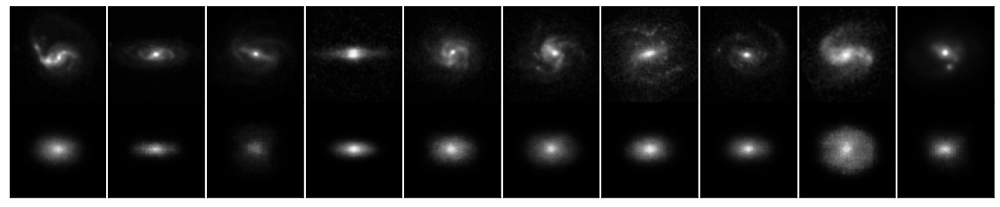

In [14]:
present_reconstruction(models,imgs,resid=False)

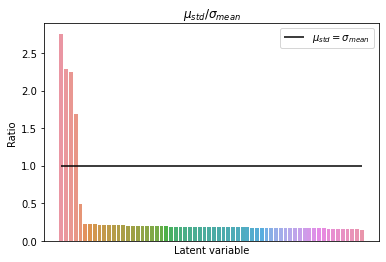

In [13]:
latent_relation_of_variances(ratio,True)

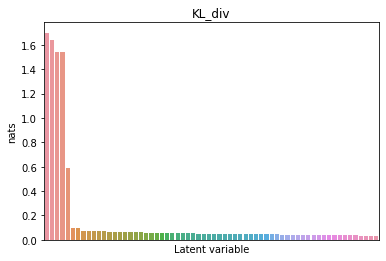

In [16]:
DKL=DKL_per_variable(z_means,z_log_vars)

In [ ]:
dis_score,resampling_errors=disentanglement_score(models,z_means,number_of_z_to_consider=64)

100%|██████████| 2000/2000 [02:26<00:00, 13.65it/s]


25/25 [==============================] - 0s 1ms/step - loss: 4.2685 - accuracy: 0.0150


In [ ]:
dis_score

0.014999999664723873

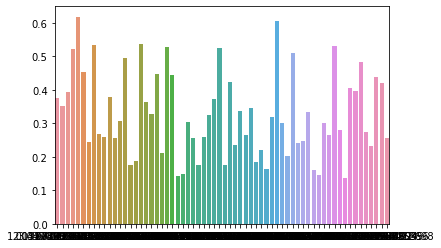

In [ ]:
rel_err=pd.Series(np.diag(resampling_errors.groupby('index').mean()),index=resampling_errors.columns[:-1])
sns.barplot(x=np.linspace(0,64,64),y=rel_err[DKL.argsort()[::-1]])

Maximal brightness 0.63799673


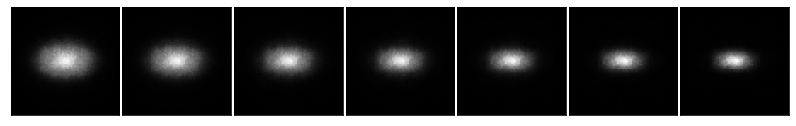

Maximal brightness 0.6442129


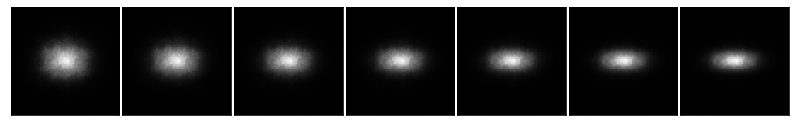

Maximal brightness 0.6938981


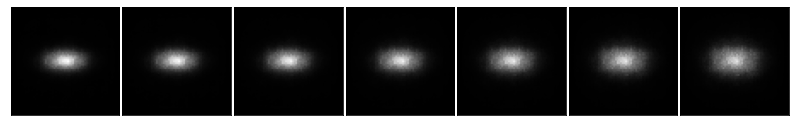

Maximal brightness 0.67958534


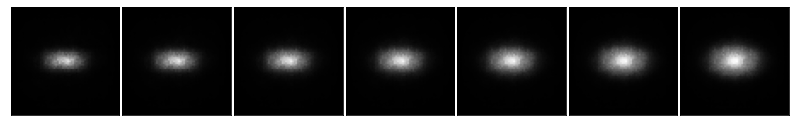

Maximal brightness 0.6546255


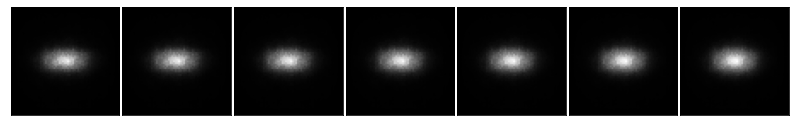

In [ ]:
galaxy_properties_from_latent_variables(models,z_means,number_of_z_to_consider=5,sort_array=DKL)

Maximal brightness 0.63664657


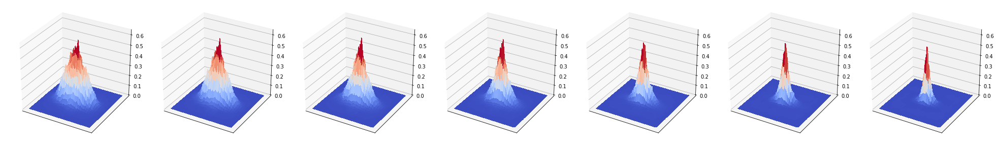

Maximal brightness 0.8072866


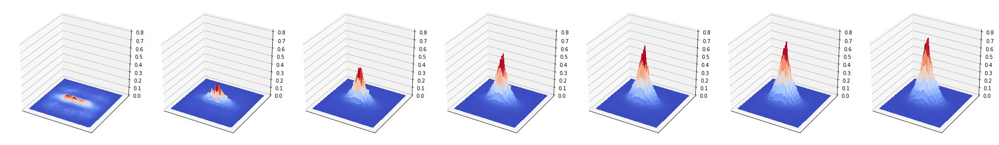

Maximal brightness 0.7844132


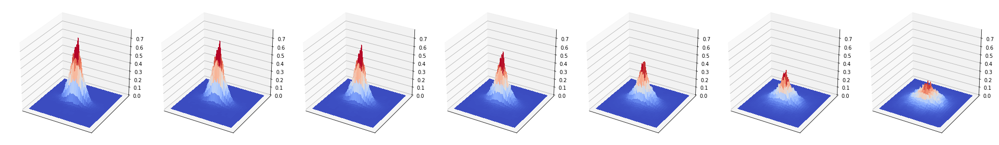

In [18]:
galaxy_properties_from_latent_variables(models,z_means,number_of_z_to_consider=3,sort_array=DKL,dimensions='3d')

## Softplus MSE

### Softplus MSE beta=1e-3

In [ ]:
beta_vae=1e-3
activation='softplus'
loss_type='mse'
models,model_loss_function,reconstruction_loss_function=get_Neural_Network(beta_vae,activation,loss_type)

Checkpoint_to_load=150
Checkpoints_Folder=Folder+'Models/Softplus_MSE_beta=1e-3/'
models['vae'].load_weights(Checkpoints_Folder+'epoch_{}/Model'.format(Checkpoint_to_load))

z_means=models['z_meaner'].predict(gal_dataset_images)
z_log_vars=models['z_log_varer'].predict(gal_dataset_images)
decoded=models['vae'].predict(gal_dataset_images)
std_of_mu=z_means.std(axis=0)
mean_of_var=(np.exp(z_log_vars/2)).mean(axis=0)
ratio=std_of_mu/mean_of_var

In [ ]:
Max_values=decoded.max(axis=(1,2,3))
Min_values=decoded.min(axis=(1,2,3))
chi_squared=np.zeros(len(gal_dataset_images))
for i,image_true in enumerate(gal_dataset_images):
  chi_squared[i]=Image_Stats.chi_sq(image_true[:,:,0],decoded[i,:,:,0])

print('chi_sq values {:.5f} ± {:.5f}, median {:.5f}'.format(chi_squared.mean(),chi_squared.std(),np.median(chi_squared)))
SSIM_stats=tf.image.ssim(gal_dataset_images.astype('double'), decoded.astype('double'),max_val=1,filter_size=8).numpy()
print('SSIM {:.3f} ± {:.3f}, median {:.3f}'.format(SSIM_stats.mean(),SSIM_stats.std(),np.median(SSIM_stats)))

print('Max values {:.3f} ± {:.3f}, median {:.3f}'.format(Max_values.mean(),Max_values.std(),np.median(Max_values)))
print('Min values {:.5f} ± {:.5f}, median {:.5f}'.format(Min_values.mean(),Min_values.std(),np.median(Min_values)))

chi_sq values 3420.13584 ± 6534.57683, median 2007.93309
SSIM 0.778 ± 0.097, median 0.783
Max values 0.934 ± 0.077, median 0.951
Min values 0.00069 ± 0.00024, median 0.00064


Maximal brightness 1.0086687


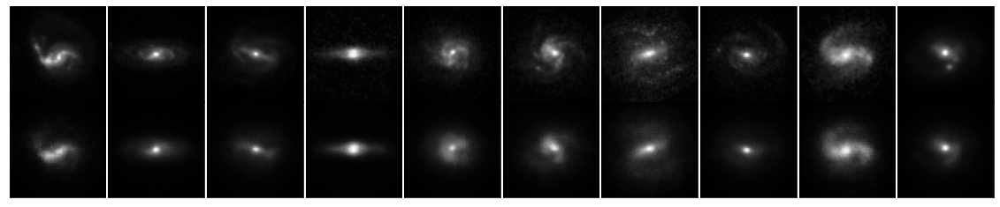

Maximal brightness 0.20388427


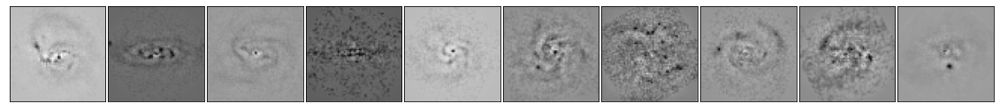

In [ ]:
present_reconstruction(models,imgs,resid=True)

Maximal brightness 1.0


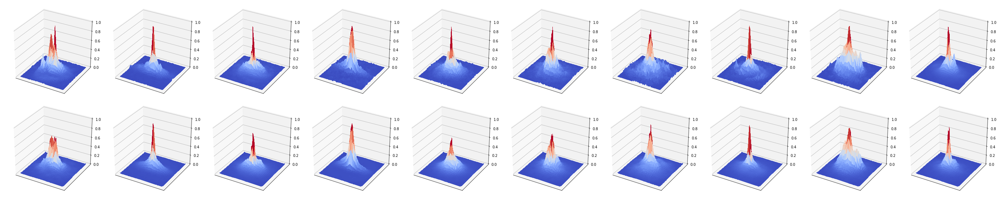

Maximal brightness 0.21642247


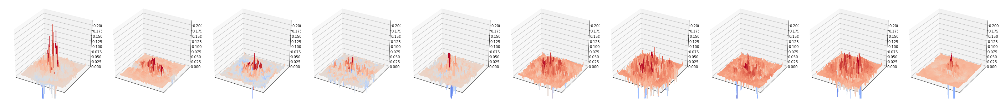

In [ ]:
present_reconstruction(models,imgs,dimensions='3d',resid=True)

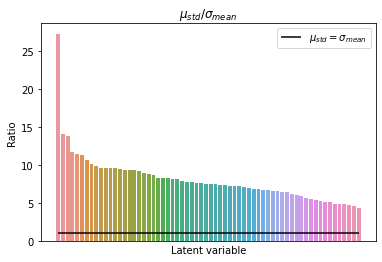

In [ ]:
latent_relation_of_variances(ratio,True)

Maximal brightness 0.9283869


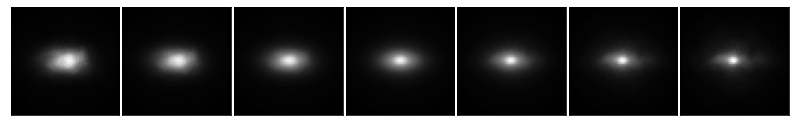

Maximal brightness 0.9076009


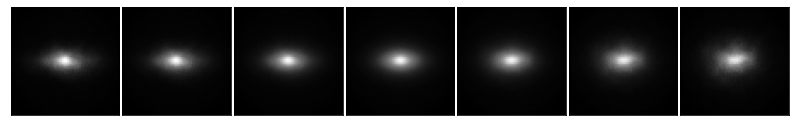

Maximal brightness 0.9402849


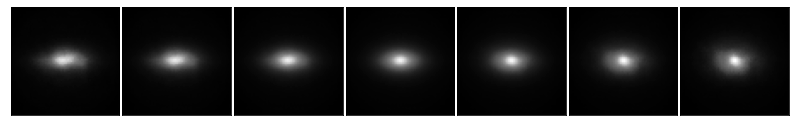

Maximal brightness 0.8611298


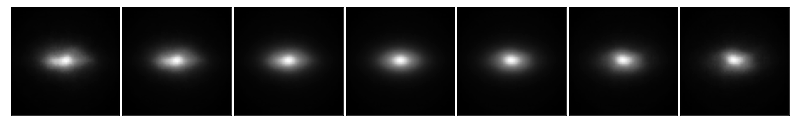

Maximal brightness 0.9214711


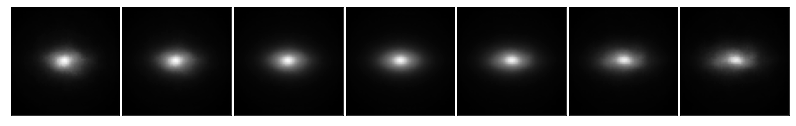

Maximal brightness 0.86375666


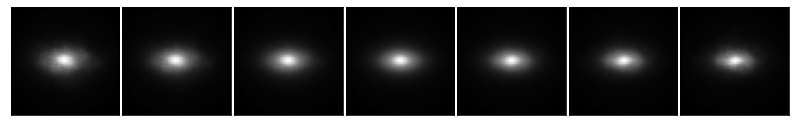

Maximal brightness 0.9150002


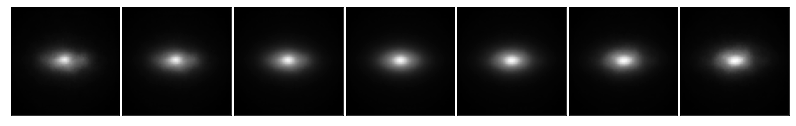

Maximal brightness 0.8865277


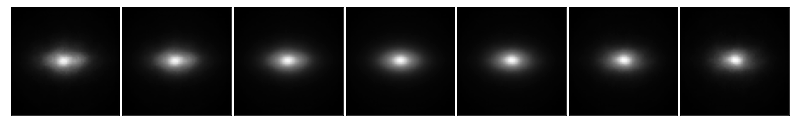

Maximal brightness 0.8754794


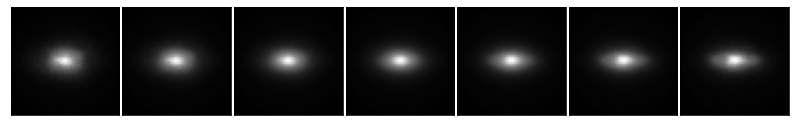

Maximal brightness 0.9207779


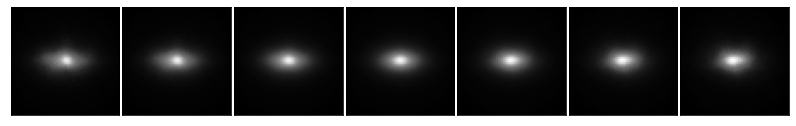

In [ ]:
galaxy_properties_from_latent_variables(models,z_means,number_of_z_to_consider=10)

Maximal brightness 1.0516669


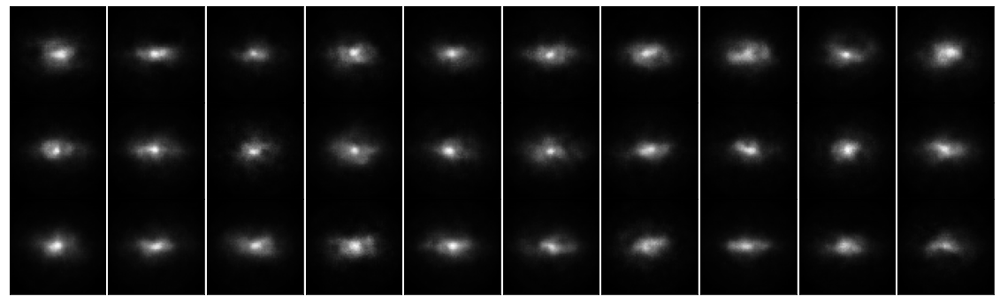

In [ ]:
sample_random_images(models,z_means)

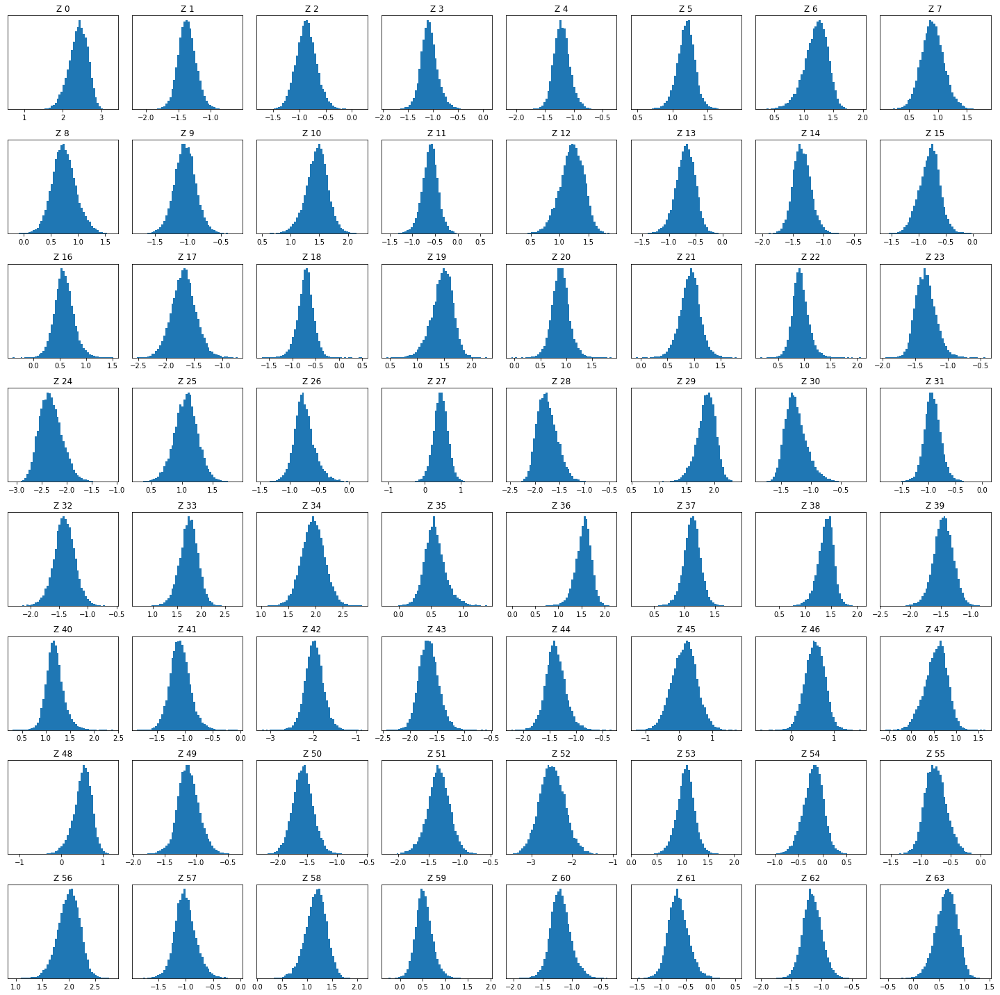

In [ ]:
latent_distribution(z_means)

## No act Chi square

### No act chi_sq beta=0.5*1e-2

In [ ]:
beta_vae=0.5*1e-2
activation=''
loss_type='chi_sq'
models,model_loss_function,reconstruction_loss_function=get_Neural_Network(beta_vae,activation,loss_type)

Checkpoint_to_load=200
Checkpoints_Folder=Folder+'Models/No_Act_chisq_beta=0.5*1e-2/'
models['vae'].load_weights(Checkpoints_Folder+'epoch_{}/Model'.format(Checkpoint_to_load))

z_means=models['z_meaner'].predict(gal_dataset_images)
z_log_vars=models['z_log_varer'].predict(gal_dataset_images)
decoded=models['vae'].predict(gal_dataset_images)
std_of_mu=z_means.std(axis=0)
mean_of_var=(np.exp(z_log_vars/2)).mean(axis=0)
ratio=std_of_mu/mean_of_var

In [ ]:
Max_values=decoded.max(axis=(1,2,3))
Min_values=decoded.min(axis=(1,2,3))
chi_squared=np.zeros(len(gal_dataset_images))
for i,image_true in enumerate(gal_dataset_images):
  chi_squared[i]=Image_Stats.chi_sq(image_true[:,:,0],decoded[i,:,:,0])

print('chi_sq values {:.5f} ± {:.5f}, median {:.5f}'.format(chi_squared.mean(),chi_squared.std(),np.median(chi_squared)))
SSIM_stats=tf.image.ssim(gal_dataset_images.astype('double'), decoded.astype('double'),max_val=1,filter_size=8).numpy()
print('SSIM {:.3f} ± {:.3f}, median {:.3f}'.format(SSIM_stats.mean(),SSIM_stats.std(),np.median(SSIM_stats)))

print('Max values {:.3f} ± {:.3f}, median {:.3f}'.format(Max_values.mean(),Max_values.std(),np.median(Max_values)))
print('Min values {:.5f} ± {:.5f}, median {:.5f}'.format(Min_values.mean(),Min_values.std(),np.median(Min_values)))

chi_sq values 345.33419 ± 619.17360, median 213.51309
SSIM 0.681 ± 0.140, median 0.679
Max values 0.765 ± 0.112, median 0.765
Min values -0.00787 ± 0.00448, median -0.00673


Maximal brightness 1.0


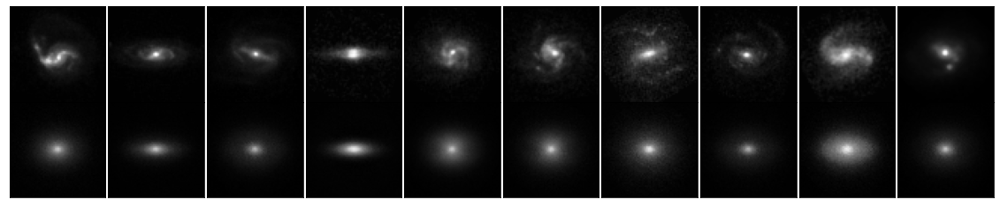

Maximal brightness 0.30080333


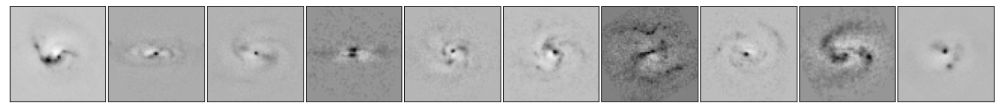

In [ ]:
present_reconstruction(models,imgs,resid=True)

Maximal brightness 1.0


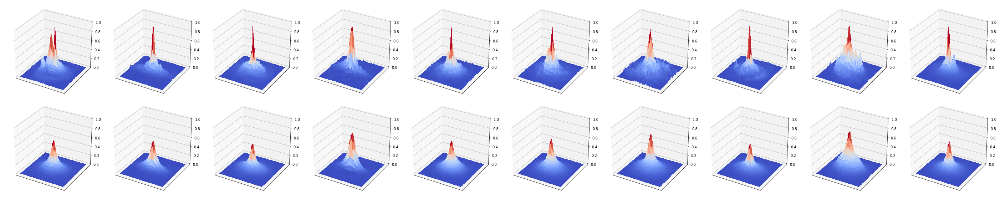

Maximal brightness 0.30316153


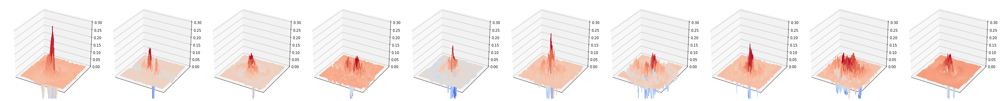

In [ ]:
present_reconstruction(models,imgs,dimensions='3d',resid=True)

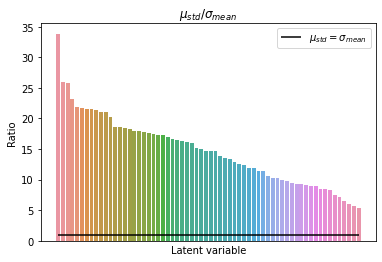

In [ ]:
latent_relation_of_variances(ratio,True)

Maximal brightness 0.90347385


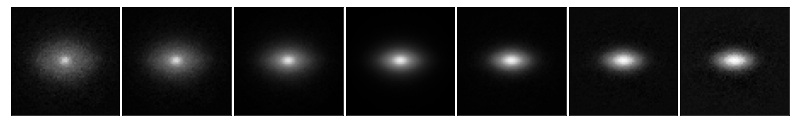

Maximal brightness 0.83515835


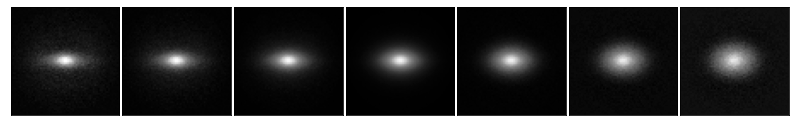

Maximal brightness 0.7717011


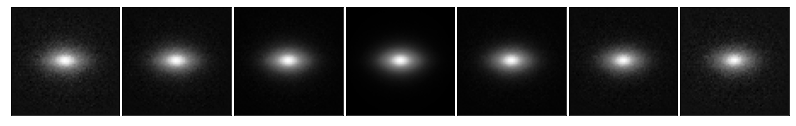

Maximal brightness 0.76378727


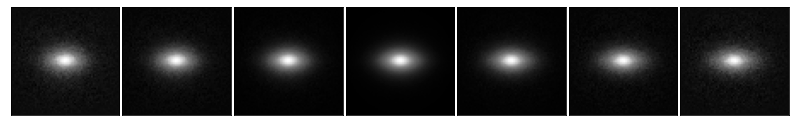

Maximal brightness 0.7800983


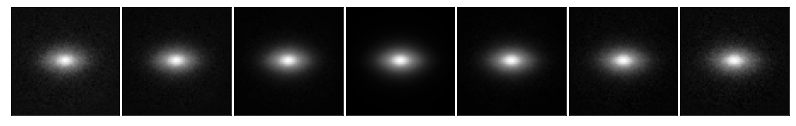

Maximal brightness 0.7766954


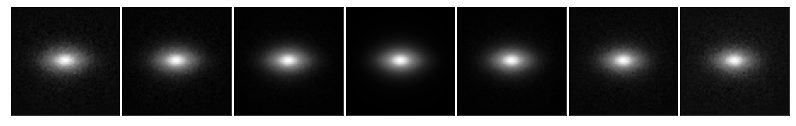

Maximal brightness 0.7924944


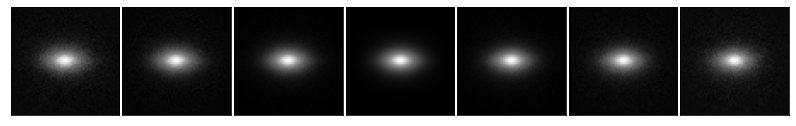

Maximal brightness 0.77429473


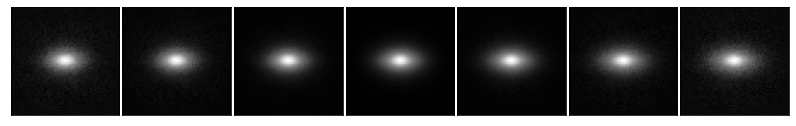

Maximal brightness 0.76893276


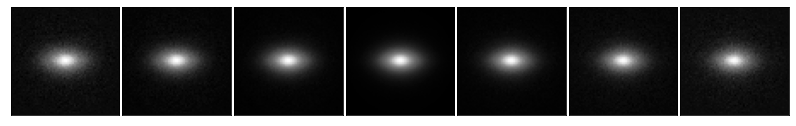

Maximal brightness 0.78493327


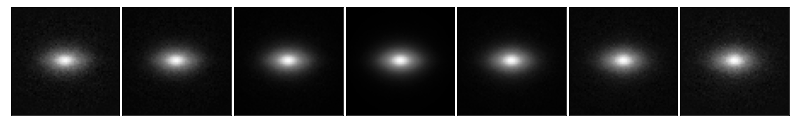

In [ ]:
galaxy_properties_from_latent_variables(models,z_means,number_of_z_to_consider=10)

Maximal brightness 0.9000698


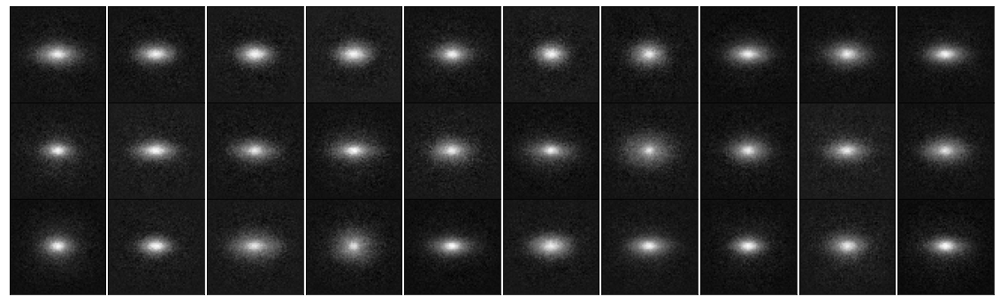

In [ ]:
sample_random_images(models,z_means)

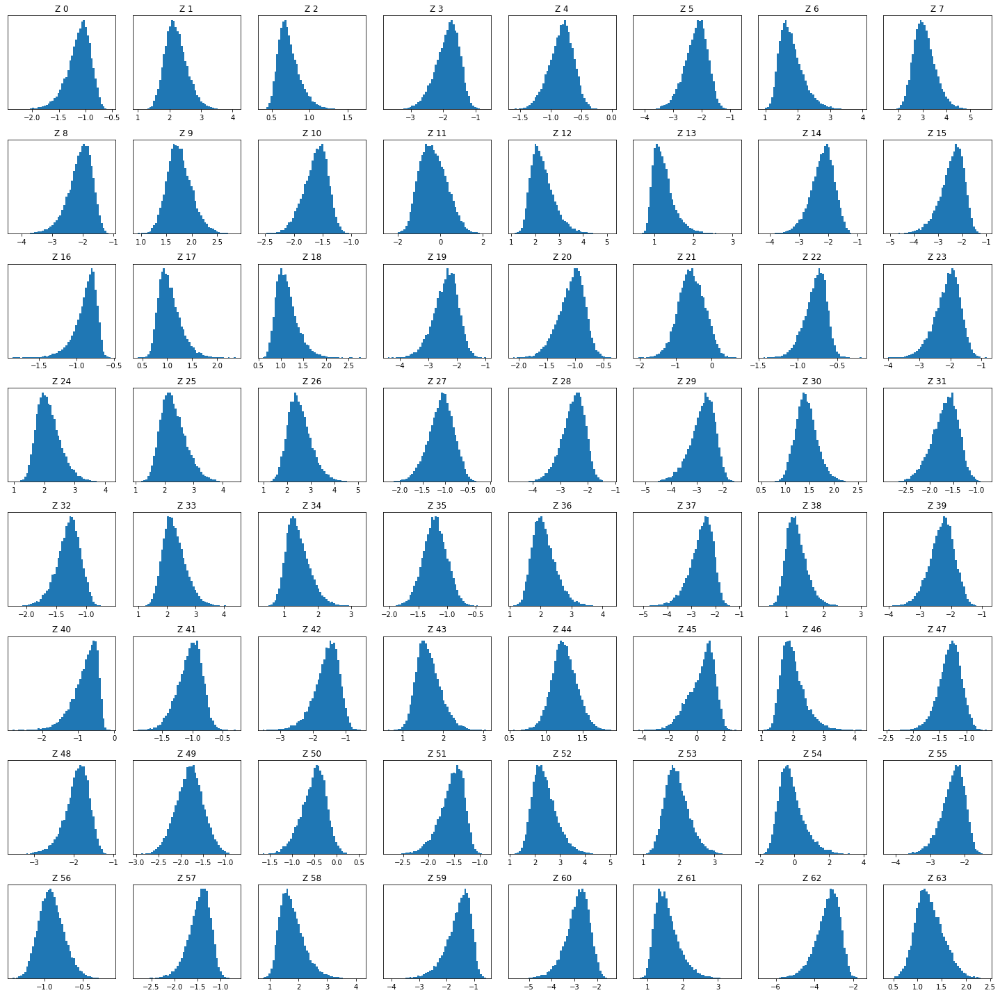

In [ ]:
latent_distribution(z_means)

### No act chi_sq beta=1e-2

In [ ]:
beta_vae=1e-2
activation=''
loss_type='chi_sq'
models,model_loss_function,reconstruction_loss_function=get_Neural_Network(beta_vae,activation,loss_type)

Checkpoint_to_load=120
Checkpoints_Folder=Folder+'Models/No_Act_chisq_beta=1e-2/'
models['vae'].load_weights(Checkpoints_Folder+'epoch_{}/Model'.format(Checkpoint_to_load))

z_means=models['z_meaner'].predict(gal_dataset_images)
z_log_vars=models['z_log_varer'].predict(gal_dataset_images)
decoded=models['vae'].predict(gal_dataset_images)
std_of_mu=z_means.std(axis=0)
mean_of_var=(np.exp(z_log_vars/2)).mean(axis=0)
ratio=std_of_mu/mean_of_var

In [ ]:
Max_values=decoded.max(axis=(1,2,3))
Min_values=decoded.min(axis=(1,2,3))
chi_squared=np.zeros(len(gal_dataset_images))
for i,image_true in enumerate(gal_dataset_images):
  chi_squared[i]=Image_Stats.chi_sq(image_true[:,:,0],decoded[i,:,:,0])

print('chi_sq values {:.5f} ± {:.5f}, median {:.5f}'.format(chi_squared.mean(),chi_squared.std(),np.median(chi_squared)))
SSIM_stats=tf.image.ssim(gal_dataset_images.astype('double'), decoded.astype('double'),max_val=1,filter_size=8).numpy()
print('SSIM {:.3f} ± {:.3f}, median {:.3f}'.format(SSIM_stats.mean(),SSIM_stats.std(),np.median(SSIM_stats)))

print('Max values {:.3f} ± {:.3f}, median {:.3f}'.format(Max_values.mean(),Max_values.std(),np.median(Max_values)))
print('Min values {:.5f} ± {:.5f}, median {:.5f}'.format(Min_values.mean(),Min_values.std(),np.median(Min_values)))

chi_sq values 458.08218 ± 813.12028, median 281.92218
SSIM 0.682 ± 0.139, median 0.680
Max values 0.763 ± 0.106, median 0.762
Min values -0.01014 ± 0.00462, median -0.00911


Maximal brightness 1.0


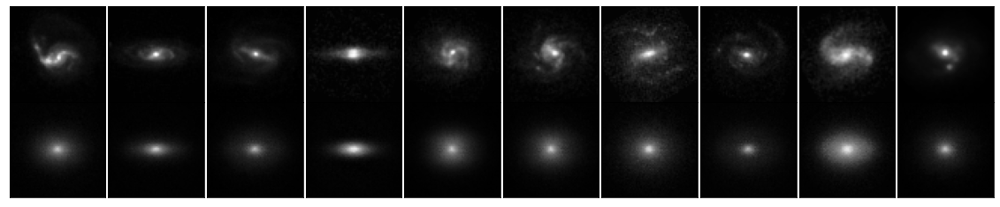

Maximal brightness 0.2848224


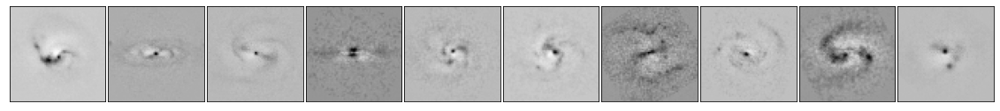

In [ ]:
present_reconstruction(models,imgs,resid=True)

Maximal brightness 1.0


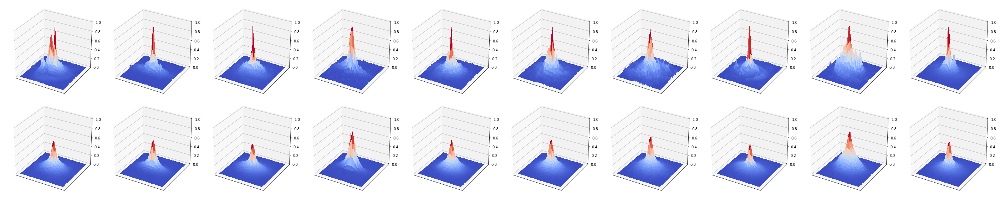

Maximal brightness 0.27746004


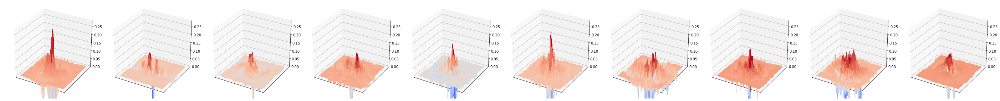

In [ ]:
present_reconstruction(models,imgs,dimensions='3d',resid=True)

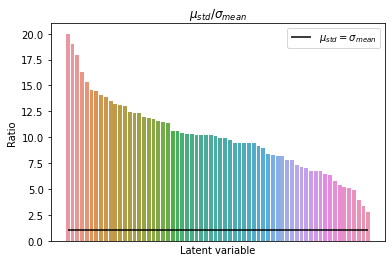

In [ ]:
latent_relation_of_variances(ratio,True)

Maximal brightness 0.82772756


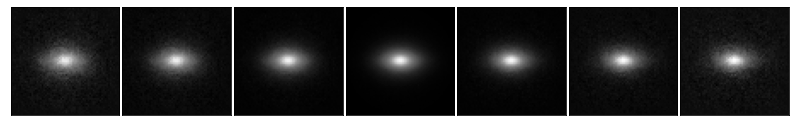

Maximal brightness 0.8281096


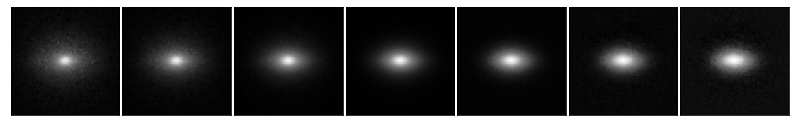

Maximal brightness 0.7746907


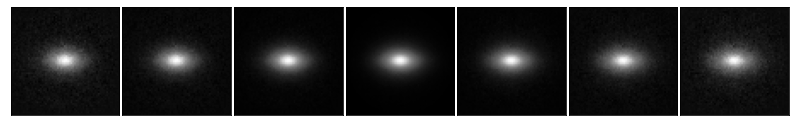

Maximal brightness 0.8918699


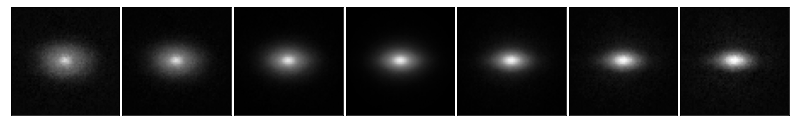

Maximal brightness 0.7728279


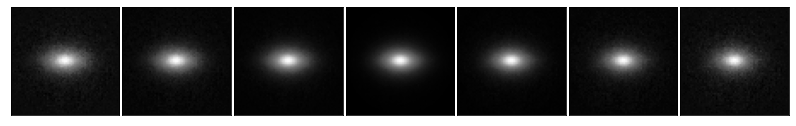

Maximal brightness 0.77195036


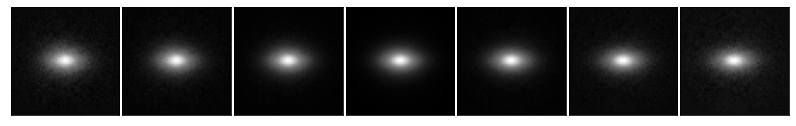

Maximal brightness 0.7666876


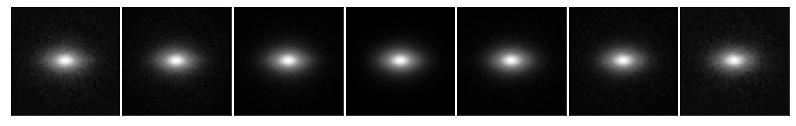

Maximal brightness 0.7609525


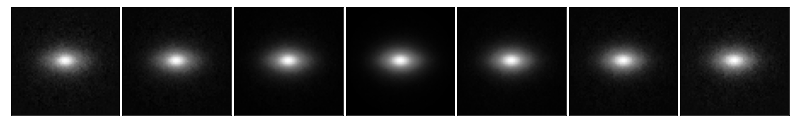

Maximal brightness 0.774187


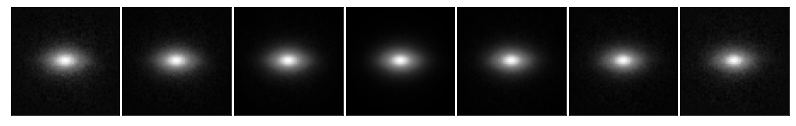

Maximal brightness 0.79108024


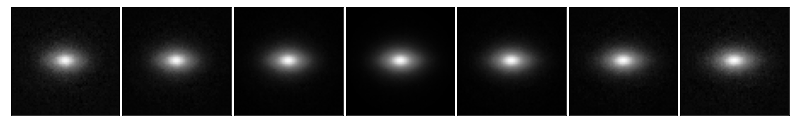

In [ ]:
galaxy_properties_from_latent_variables(models,z_means,number_of_z_to_consider=10)

Maximal brightness 0.95286906


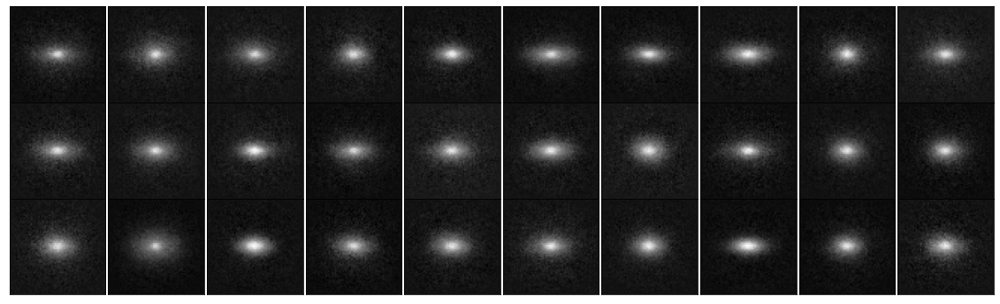

In [ ]:
sample_random_images(models,z_means)

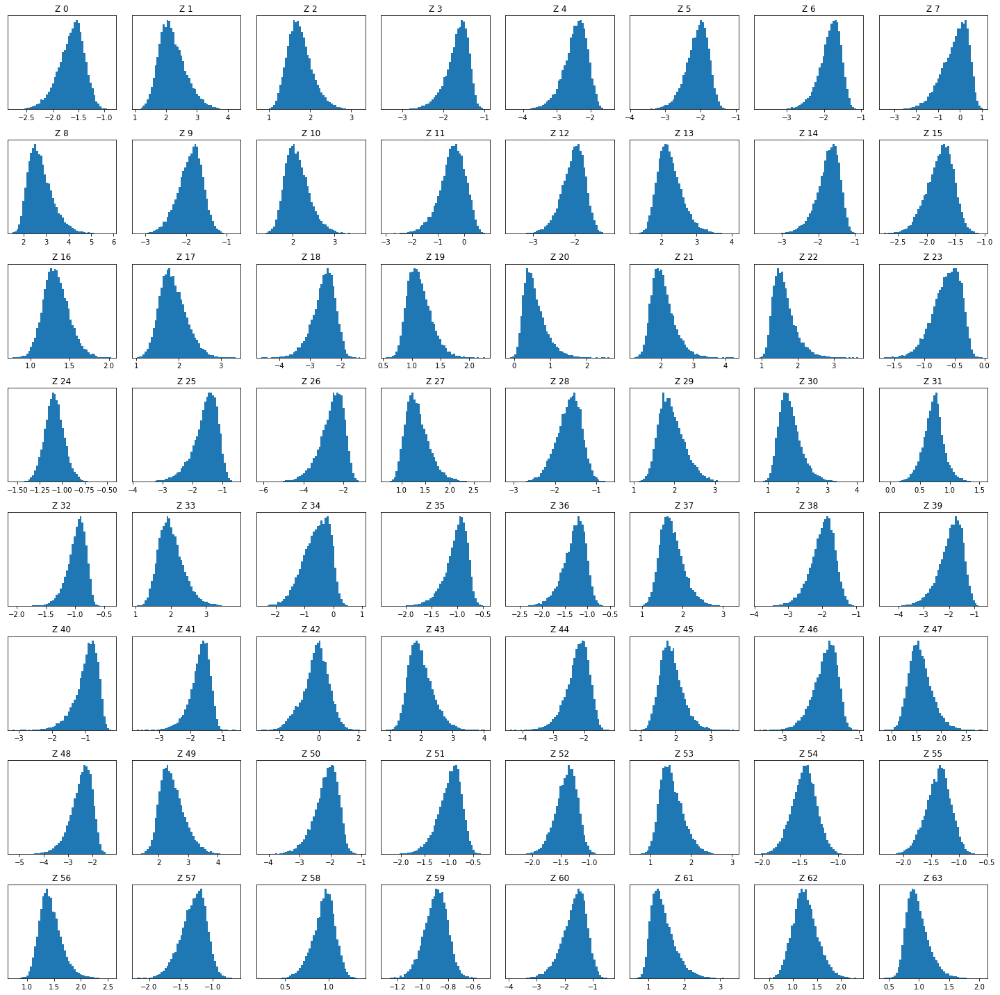

In [ ]:
latent_distribution(z_means)